# **Activity Detection**

Part 1

Data source: https://www.kaggle.com/datasets/luisomoreau/activity-detection

Our data consists of 12 folders, where each folder represents one activity. In each folder (except one), there are 12 CSV files with data. Each CSV file corresponds to one sensor that recorded the data. A description of the files with their values is provided below.

**Acceleration (Accelerometer)**
- Accelerometer_z: Acceleration along the Z-axis.
- Accelerometer_y: Acceleration along the Y-axis.
- Accelerometer_x: Acceleration along the X-axis.

**Annotation** - empty  


**Gravity**
- Gravity_z: Gravity vector component along the Z-axis.
- Gravity_y: Gravity vector component along the Y-axis.
- Gravity_x: Gravity vector component along the X-axis.

**Gyroscope**
- Gyroscope_z: Angular velocity around the Z-axis.
- Gyroscope_y: Angular velocity around the Y-axis.
- Gyroscope_x: Angular velocity around the X-axis.

**Location**
- Location_bearingAccuracy: Bearing (azimuth) accuracy in location.
- Location_speedAccuracy: Speed accuracy in location.
- Location_verticalAccuracy: Altitude accuracy in location.
- Location_horizontalAccuracy: Horizontal accuracy in location.
- Location_speed: Speed in location.
- Location_bearing: Bearing (azimuth) in location.
- Location_altitude: Altitude in location.
- Location_longitude: Longitude in location.
- Location_latitude: Latitude in location.

**Metadata** - additional data

**GPS (LocationGps)**
- LocationGps_bearingAccuracy: Bearing (azimuth) accuracy obtained from GPS.
- LocationGps_speedAccuracy: Speed accuracy obtained from GPS.
- LocationGps_verticalAccuracy: Altitude accuracy obtained from GPS.
- LocationGps_horizontalAccuracy: Horizontal accuracy obtained from GPS.
- LocationGps_speed: Speed obtained from GPS.
- LocationGps_bearing: Bearing (azimuth) obtained from GPS.
- LocationGps_altitude: Altitude obtained from GPS.
- LocationGps_longitude: Longitude obtained from GPS.
- LocationGps_latitude: Latitude obtained from GPS.

**Network Location (LocationNetwork)**
- LocationNetwork_bearingAccuracy: Bearing (azimuth) accuracy obtained from the network.
- LocationNetwork_speedAccuracy: Speed accuracy obtained from the network.
- LocationNetwork_verticalAccuracy: Altitude accuracy obtained from the network.
- LocationNetwork_horizontalAccuracy: Horizontal accuracy obtained from the network.
- LocationNetwork_speed: Speed obtained from the network.
- LocationNetwork_bearing: Bearing (azimuth) obtained from the network.
- LocationNetwork_altitude: Altitude obtained from the network.
- LocationNetwork_longitude: Longitude obtained from the network.
- LocationNetwork_latitude: Latitude obtained from the network.

**Magnetometer**
- Magnetometer_z: Magnetic field strength along the Z-axis.
- Magnetometer_y: Magnetic field strength along the Y-axis.
- Magnetometer_x: Magnetic field strength along the X-axis.

**Orientation**
- Orientation_qz: Z component of the quaternion representing orientation.
- Orientation_qy: Y component of the quaternion representing orientation.
- Orientation_qx: X component of the quaternion representing orientation.
- Orientation_qw: W component of the quaternion representing orientation.
- Orientation_roll: Roll angle of the orientation.
- Orientation_pitch: Pitch angle of the orientation.
- Orientation_yaw: Yaw angle of the orientation.

**Pedometer**
- Pedometer_steps: Number of steps recorded by the pedometer.

**Total Acceleration**
- TotalAcceleration_z: Total acceleration along the Z-axis.
- TotalAcceleration_y: Total acceleration along the Y-axis.
- TotalAcceleration_x: Total acceleration along the X-axis.

## **BUSINESS GOAL**

We work for a company that makes devices for athletes (like sports watches) that track physical activities. Using sensors, they collect data such as speed and location from each activity separately. The user doesn't select the type of activity - the smart system just knows when they start doing something. This way, we get a bunch of activities with different data points. We want to cluster these activities to figure out what kinds of activities our users prefer and when they do them. This can be used for more personalized ads or for classification problems.

## **EDA**

### Imports

In [33]:
import pandas as pd
import numpy as np
import datetime
import os
import seaborn as sns
import matplotlib.pyplot as plt   
import math

### Reading csv

Considering only one activity now because there are the same csv files everywhere. Now we want to get a preliminary overview of the dataset and its features. Annotation is empty csv (in all activities) so leaving it.

In [34]:
file_paths = [
    ('..//data//Cycling-2023-09-14_06-22-31//Accelerometer.csv', 'Accelerometer'),
    ('..//data//Cycling-2023-09-14_06-22-31//Gravity.csv', 'Gravity'),
    ('..//data//Cycling-2023-09-14_06-22-31//Gyroscope.csv', 'Gyroscope'),
    ('..//data//Cycling-2023-09-14_06-22-31//Location.csv', 'Location'),
    ('..//data//Cycling-2023-09-14_06-22-31//LocationGps.csv', 'LocationGps'),
    ('..//data//Cycling-2023-09-14_06-22-31//LocationNetwork.csv', 'LocationNetwork'),
    ('..//data//Cycling-2023-09-14_06-22-31//Magnetometer.csv', 'Magnetometer'),
    ('..//data//Cycling-2023-09-14_06-22-31//Metadata.csv', 'Metadata'),
    ('..//data//Cycling-2023-09-14_06-22-31//Orientation.csv', 'Orientation'),
    ('..//data//Cycling-2023-09-14_06-22-31//Pedometer.csv', 'Pedometer'),
    ('..//data//Cycling-2023-09-14_06-22-31//TotalAcceleration.csv', 'TotalAcceleration')
]

### Preliminary overview

In [35]:
dataframes = {name: pd.read_csv(path) for path, name in file_paths}

In [36]:
for name,df in dataframes.items():
    print(name, df.shape)

Accelerometer (71461, 5)
Gravity (71461, 5)
Gyroscope (71847, 5)
Location (230, 11)
LocationGps (181, 11)
LocationNetwork (17, 11)
Magnetometer (9037, 5)
Metadata (1, 10)
Orientation (71461, 9)
Pedometer (32, 3)
TotalAcceleration (71456, 5)


In [37]:
def print_info(df,name):
        print("=====================================================================================================\n\n")
        print(f"{name} - below\n")
        print("=====================================================================================================\n\n")
        print(df.head())
        print("\n")
        print(df.info())

In [38]:
for name,df in dataframes.items():
    print_info(df,name)



Accelerometer - below



                  time  seconds_elapsed         z         y         x
0  1694672551573238300         0.121238  0.112874 -0.020792  0.156903
1  1694672551575757300         0.123757  0.235006 -0.003417  0.169683
2  1694672551578276400         0.126276  0.223140 -0.081017  0.135991
3  1694672551580795600         0.128796  0.191143 -0.067305  0.127650
4  1694672551583314400         0.131314  0.076245 -0.029743  0.083652


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71461 entries, 0 to 71460
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   time             71461 non-null  int64  
 1   seconds_elapsed  71461 non-null  float64
 2   z                71461 non-null  float64
 3   y                71461 non-null  float64
 4   x                71461 non-null  float64
dtypes: float64(4), int64(1)
memory usage: 2.7 MB
None


Gravity - below



                  time  seconds_elapsed      

We decided to not consider Metadata in further analysis due to lack of the importance.

### Merging CSV files within one activity

Now we can merge all csv files into one dataframe. We will use the time as the index (so we don't need seconds_elapsed column - we won't include it). We're performing a full join, simultaneously filling in missing values with the closest data available. As we said we will not include Metadata and Annotation.

In [39]:
# Path to the main directory
path = '..//data//'
os.listdir(path)

['Cycling-2023-09-14_06-22-31',
 'Cycling-2023-09-14_06-33-47',
 'Cycling-2023-09-14_06-47-00',
 'Cycling-2023-09-16_07-43-07',
 'Cycling-2023-09-16_09-25-09',
 'Cycling-2023-10-18_06-36-17',
 'Cycling-2023-10-18_06-51-26',
 'Sitting-2023-09-14_08-37-45',
 'Sitting-2023-09-14_09-11-15',
 'Sitting-2023-10-18_09-05-37',
 'Walking-2023-09-14_21-51-59',
 'Walking-2023-09-16_18-14-40']

### Deleting unwanted csv files

In [40]:
# Listing all folders in the main directory
contents = [folder for folder in os.listdir(path) if os.path.isdir(os.path.join(path, folder))]

for folder in contents:
    
    # Paths to the new folder where we'll save the cleaned data
    new_folder_path = '..//cleared_data//'
    
    full_new_folder_path = os.path.join(new_folder_path, folder)
    os.makedirs(full_new_folder_path, exist_ok=True)
    
    # Full path to the folder
    full_folder_path = os.path.join(path, folder)
    
    # Listing all files in the folder
    files = os.listdir(full_folder_path)
    
    for file in files:
        full_file_path = os.path.join(full_folder_path, file)
        
        # Checking if the file is not empty before loading
        if os.path.getsize(full_file_path) > 0:
            try:
                # Attempt to read the CSV file
                df = pd.read_csv(full_file_path)
                if 'time' in df.columns:
                    df['time'] = pd.to_datetime(df['time'])
                else:
                    continue
                print(f'File loaded: {full_file_path}')
                if 'seconds_elapsed' in df.columns:
                    df = df.drop(columns=['seconds_elapsed'])
                    df.to_csv(full_new_folder_path+'//'+file, index=False)
            except pd.errors.EmptyDataError:
                print(f'The file {full_file_path} is empty or has no columns to parse.')
        else:
            print(f'The file {full_file_path} is empty.')


File loaded: ..//data//Cycling-2023-09-14_06-22-31\Accelerometer.csv
The file ..//data//Cycling-2023-09-14_06-22-31\Annotation.csv is empty.
File loaded: ..//data//Cycling-2023-09-14_06-22-31\Gravity.csv
File loaded: ..//data//Cycling-2023-09-14_06-22-31\Gyroscope.csv
File loaded: ..//data//Cycling-2023-09-14_06-22-31\Location.csv
File loaded: ..//data//Cycling-2023-09-14_06-22-31\LocationGps.csv
File loaded: ..//data//Cycling-2023-09-14_06-22-31\LocationNetwork.csv
File loaded: ..//data//Cycling-2023-09-14_06-22-31\Magnetometer.csv
File loaded: ..//data//Cycling-2023-09-14_06-22-31\Orientation.csv
File loaded: ..//data//Cycling-2023-09-14_06-22-31\Pedometer.csv
File loaded: ..//data//Cycling-2023-09-14_06-22-31\TotalAcceleration.csv
File loaded: ..//data//Cycling-2023-09-14_06-33-47\Accelerometer.csv
The file ..//data//Cycling-2023-09-14_06-33-47\Annotation.csv is empty.
File loaded: ..//data//Cycling-2023-09-14_06-33-47\Gravity.csv
File loaded: ..//data//Cycling-2023-09-14_06-33-47\G

### Merging

In [41]:
folder_path = '../cleared_data'
folders = os.listdir(folder_path)

for folder in folders:
    one_activity_path = os.path.join(folder_path, folder)
    print("Files in", folder + ":")
    print(os.listdir(one_activity_path))
    print()

i = 1
for dir in folders:
    activity = dir.split("-")[0]

    folder = os.path.join(folder_path, dir)

    file_list = [f for f in os.listdir(folder) if f.endswith('.csv')]

    result = pd.DataFrame({'time': []})
    
    

    for file_path in file_list:
        file = os.path.splitext(os.path.basename(file_path))[0]
        if file == "Annotation" or file == "Metadata":
            continue
        file_name = file + "_" + str(i)

        file_data = pd.read_csv(os.path.join(folder, file_path))

        file_data['time'] = pd.to_datetime(file_data['time'])
        
        # Rename columns except 'time'
        file_data = file_data.rename(columns={col: file + "_" + col if col != 'time' else col for col in file_data.columns})

        if result.empty:
            result = file_data
        else:
            # Perform fuzzy join on 'time' column
            result = pd.merge_asof(result.sort_values('time'), file_data.sort_values('time'), on='time', direction='nearest')
            
            
    result['time'] = pd.to_datetime(result['time'])
    result['time'] = result['time'].apply(lambda x: x.timestamp()*1000000)
    result.to_csv(f'../merged_data2/{activity}_{i}.csv', index=False)
    i += 1

Files in Cycling-2023-09-14_06-22-31:
['Accelerometer.csv', 'Gravity.csv', 'Gyroscope.csv', 'Location.csv', 'LocationGps.csv', 'LocationNetwork.csv', 'Magnetometer.csv', 'Orientation.csv', 'Pedometer.csv', 'TotalAcceleration.csv']

Files in Cycling-2023-09-14_06-33-47:
['Accelerometer.csv', 'Gravity.csv', 'Gyroscope.csv', 'Location.csv', 'LocationGps.csv', 'LocationNetwork.csv', 'Magnetometer.csv', 'Orientation.csv', 'Pedometer.csv', 'TotalAcceleration.csv']

Files in Cycling-2023-09-14_06-47-00:
['Accelerometer.csv', 'Gravity.csv', 'Gyroscope.csv', 'Location.csv', 'LocationGps.csv', 'LocationNetwork.csv', 'Magnetometer.csv', 'Orientation.csv', 'Pedometer.csv', 'TotalAcceleration.csv']

Files in Cycling-2023-09-16_07-43-07:
['Accelerometer.csv', 'Gravity.csv', 'Gyroscope.csv', 'Location.csv', 'LocationGps.csv', 'LocationNetwork.csv', 'Magnetometer.csv', 'Orientation.csv', 'Pedometer.csv', 'TotalAcceleration.csv']

Files in Cycling-2023-09-16_09-25-09:
['Accelerometer.csv', 'Gravity.csv

### Reading files from the merged_data2 folder

In [42]:
import pandas as pd

cycling_1 = pd.read_csv('..//merged_data2//Cycling_1.csv')
cycling_1['id'] = 'cycling_1'
cycling_2 = pd.read_csv('..//merged_data2//Cycling_2.csv')
cycling_2['id'] = 'cycling_2'
cycling_3 = pd.read_csv('..//merged_data2//Cycling_3.csv')
cycling_3['id'] = 'cycling_3'
cycling_4 = pd.read_csv('..//merged_data2//Cycling_4.csv')
cycling_4['id'] = 'cycling_4'
cycling_5 = pd.read_csv('..//merged_data2//Cycling_5.csv')
cycling_5['id'] = 'cycling_5'
cycling_6 = pd.read_csv('..//merged_data2//Cycling_6.csv')
cycling_6['id'] = 'cycling_6'
cycling_7 = pd.read_csv('..//merged_data2//Cycling_7.csv')
cycling_7['id'] = 'cycling_7'
sitting_8 = pd.read_csv('..//merged_data2//Sitting_8.csv')
sitting_8['id'] = 'sitting_8'
sitting_9 = pd.read_csv('..//merged_data2//Sitting_9.csv')
sitting_9['id'] = 'sitting_9'
sitting_10 = pd.read_csv('..//merged_data2//Sitting_10.csv')
sitting_10['id'] = 'sitting_10'
walking_11 = pd.read_csv('..//merged_data2//Walking_11.csv')
walking_11['id'] = 'walking_11'
walking_12 = pd.read_csv('..//merged_data2//Walking_12.csv')
walking_12['id'] = 'walking_12'

In [43]:
dataframes = [cycling_1, cycling_2, cycling_3, cycling_4, cycling_5, cycling_6, cycling_7, sitting_8, sitting_9, sitting_10, walking_11, walking_12]

### Looking for unnecessary features

**Accelerometer** - can be important in movement analysis

**Annotation** - deleted

**Gravity** - skipped - unnsecessary (same value about 9.81)

**Gyroscope** - can be important same as accelerometer

**Location, LocationGPS, LocationNetwork** - at this moment it seems to be important

**Magnetometer** - can be important

**Metadata** - deleted

**Orientation** - we drop columns Orientation_qx, Orientation_qy, Orientation_qz, Orientation_qw, because they contain the same information as Orientation_roll, Orientation_pitch, Orientation_yaw


**Pedometer** - number of steps, can be important

**TotalAcceleration** - (Accelerometer + Gravity =?= TotalAcceleration) (HYPOTHESIS) - can be important 

In [44]:
for df in dataframes:
    tmp = pd.DataFrame({
        'x': abs(df['Accelerometer_x'] + df['Gravity_x'] - df['TotalAcceleration_x']),
        'y': abs(df['Accelerometer_y'] + df['Gravity_y'] - df['TotalAcceleration_y']),
        'z': abs(df['Accelerometer_z'] + df['Gravity_z'] - df['TotalAcceleration_z'])
    }).dropna()     
    print(tmp.describe())

                  x             y             z
count  7.146100e+04  71461.000000  71461.000000
mean   7.104362e-06      0.000003      0.000008
std    8.647860e-04      0.000335      0.000803
min    0.000000e+00      0.000000      0.000000
25%    0.000000e+00      0.000000      0.000000
50%    0.000000e+00      0.000000      0.000000
75%    4.440892e-16      0.000000      0.000000
max    1.560000e-01      0.046050      0.120000
                  x             y             z
count  1.707160e+05  1.707160e+05  1.707160e+05
mean   1.323289e-07  2.250050e-07  3.006728e-08
std    5.336690e-05  9.184914e-05  1.198158e-05
min    0.000000e+00  0.000000e+00  0.000000e+00
25%    0.000000e+00  0.000000e+00  0.000000e+00
50%    0.000000e+00  0.000000e+00  0.000000e+00
75%    0.000000e+00  0.000000e+00  4.440892e-16
max    2.205002e-02  3.795004e-02  4.950523e-03
                   x             y             z
count  144456.000000  1.444560e+05  1.444560e+05
mean        0.000002  4.385773e-06  6.

Values close to 0, so we think we can leave only TotalAcceleration in our data frame.

### Histograms

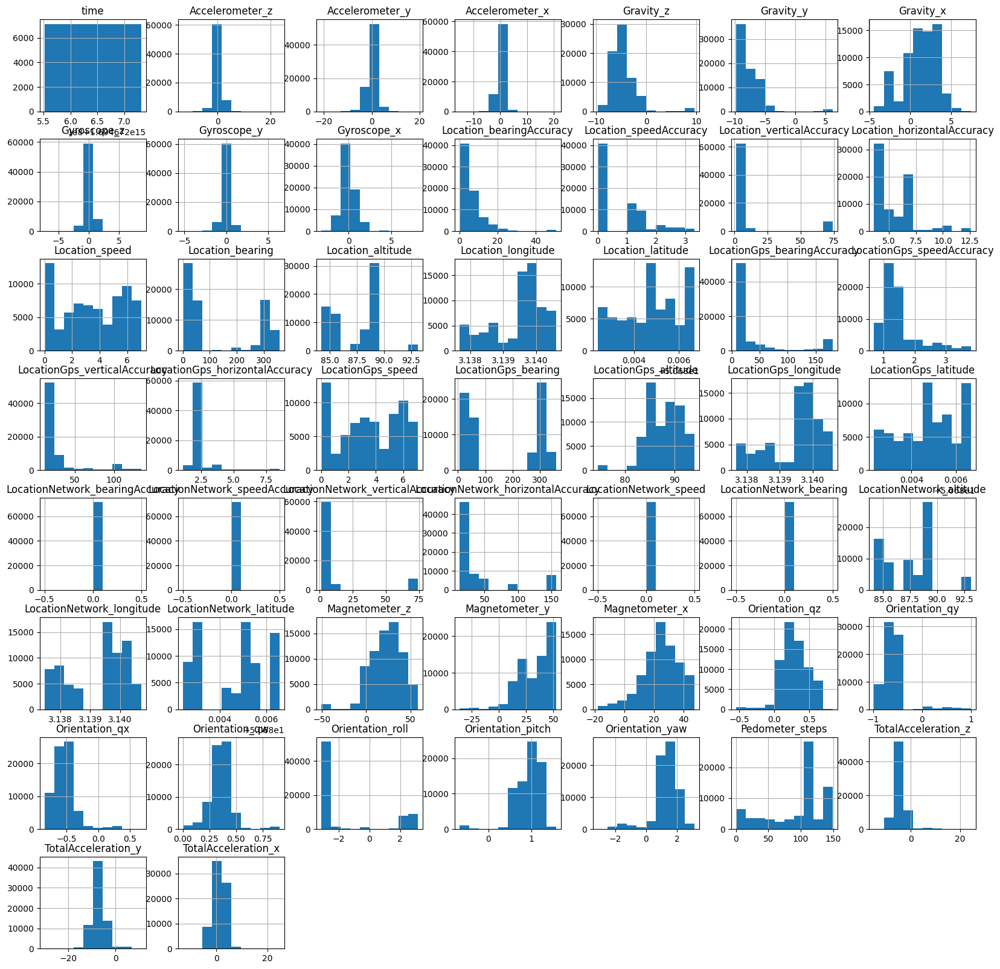

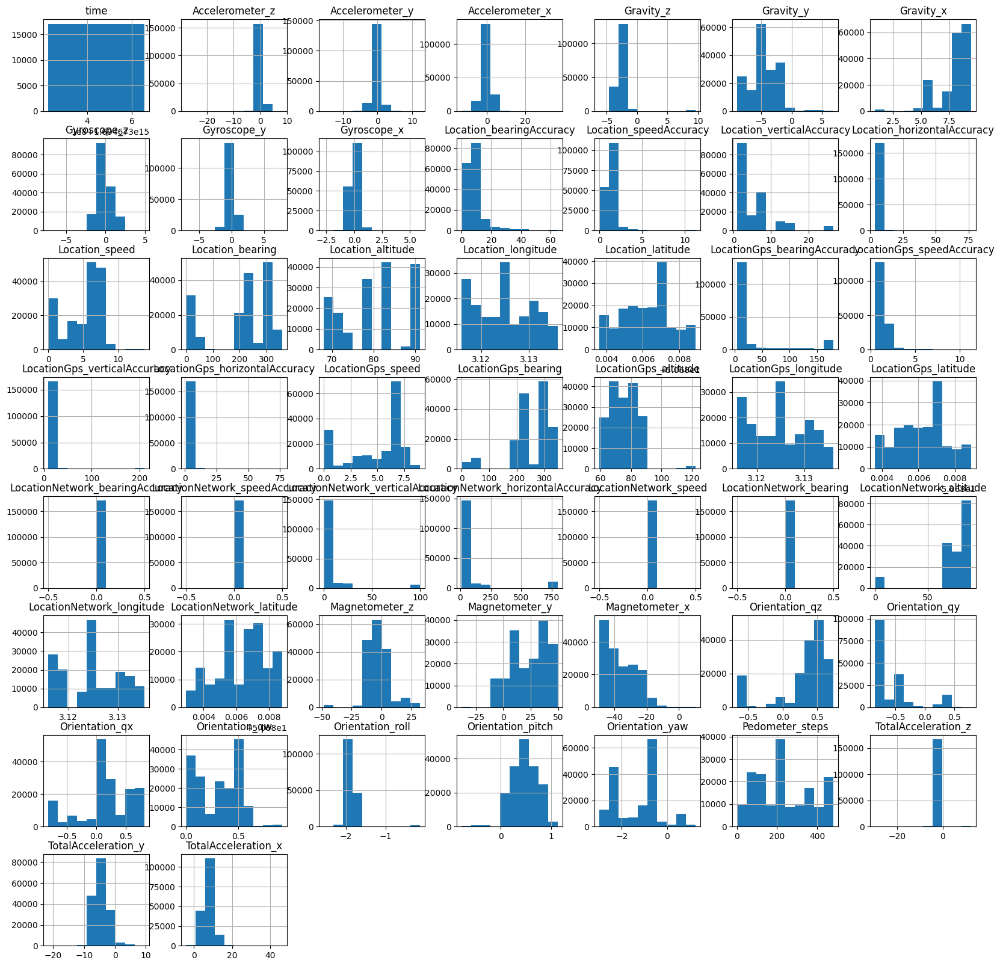

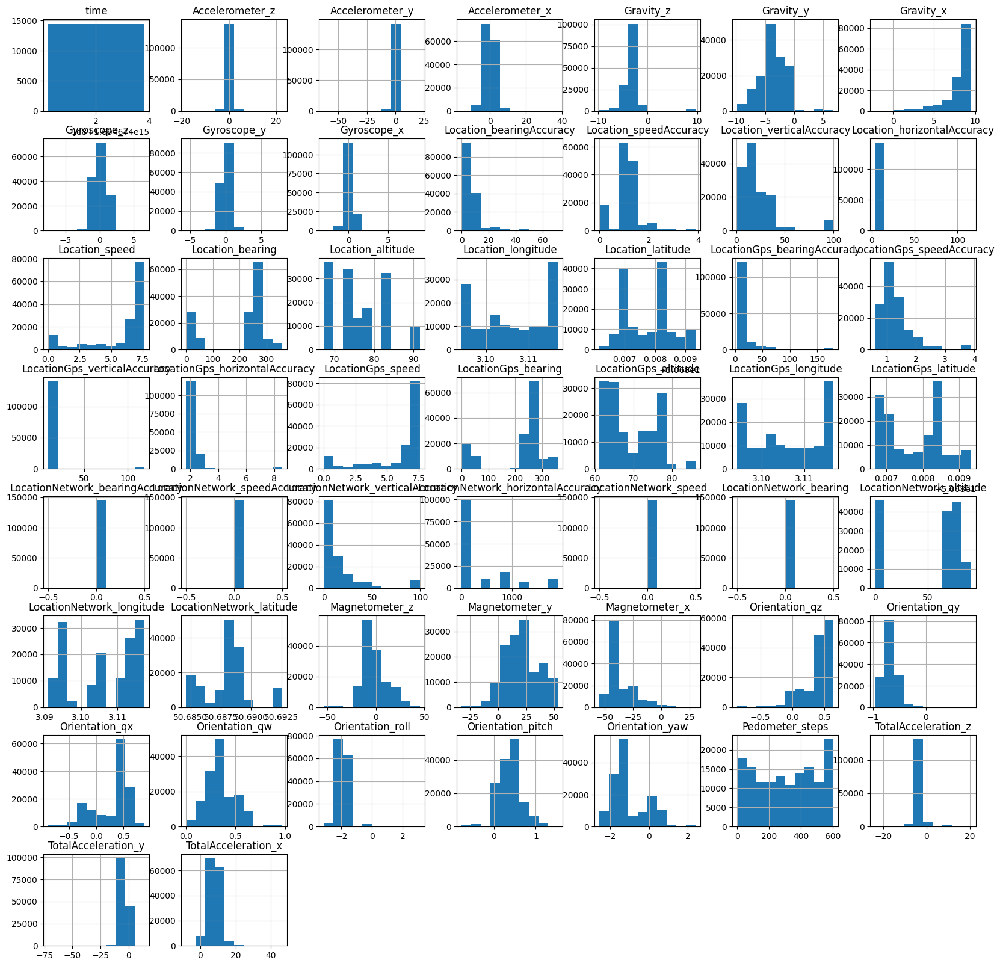

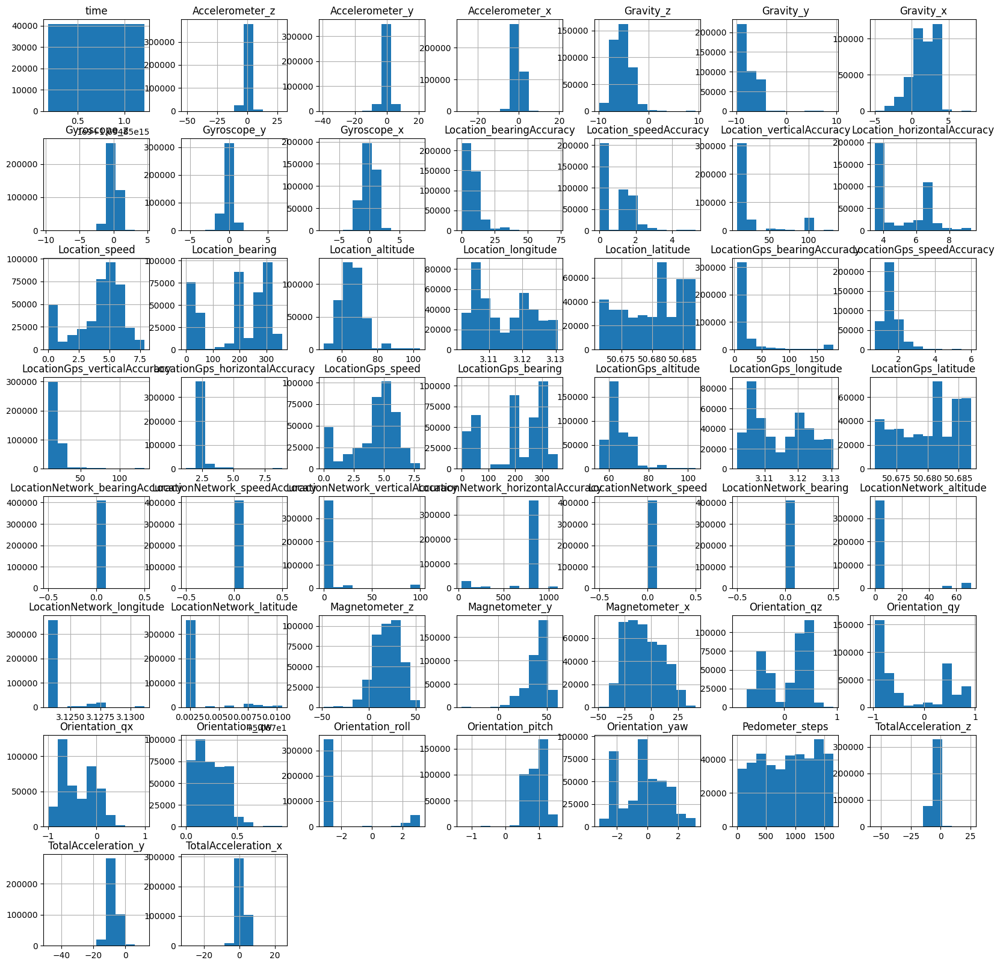

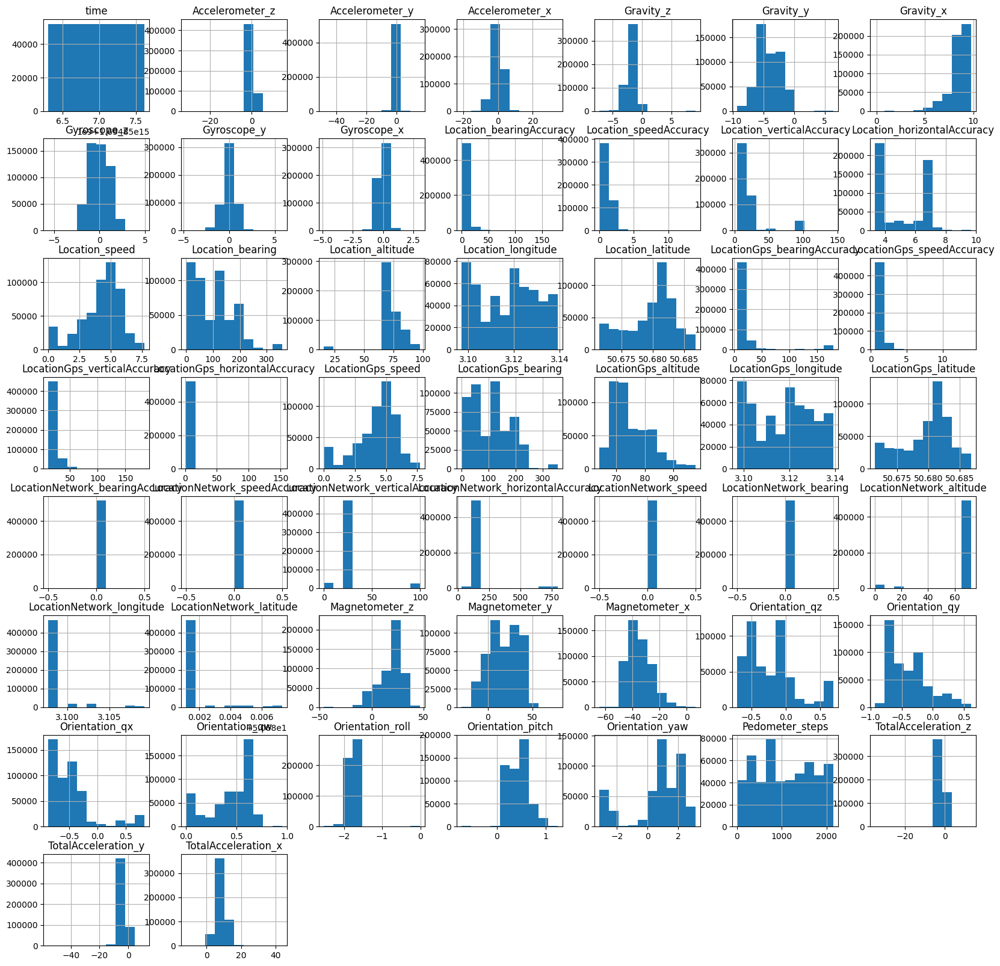

...

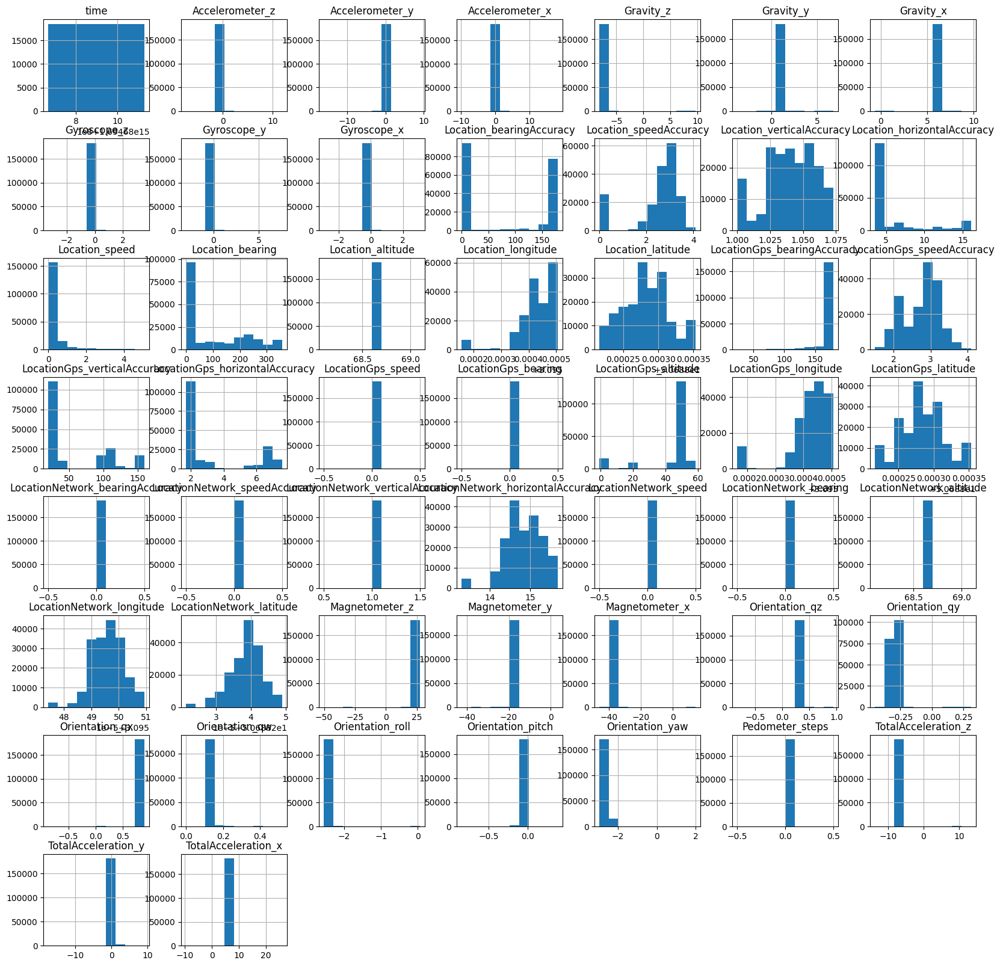

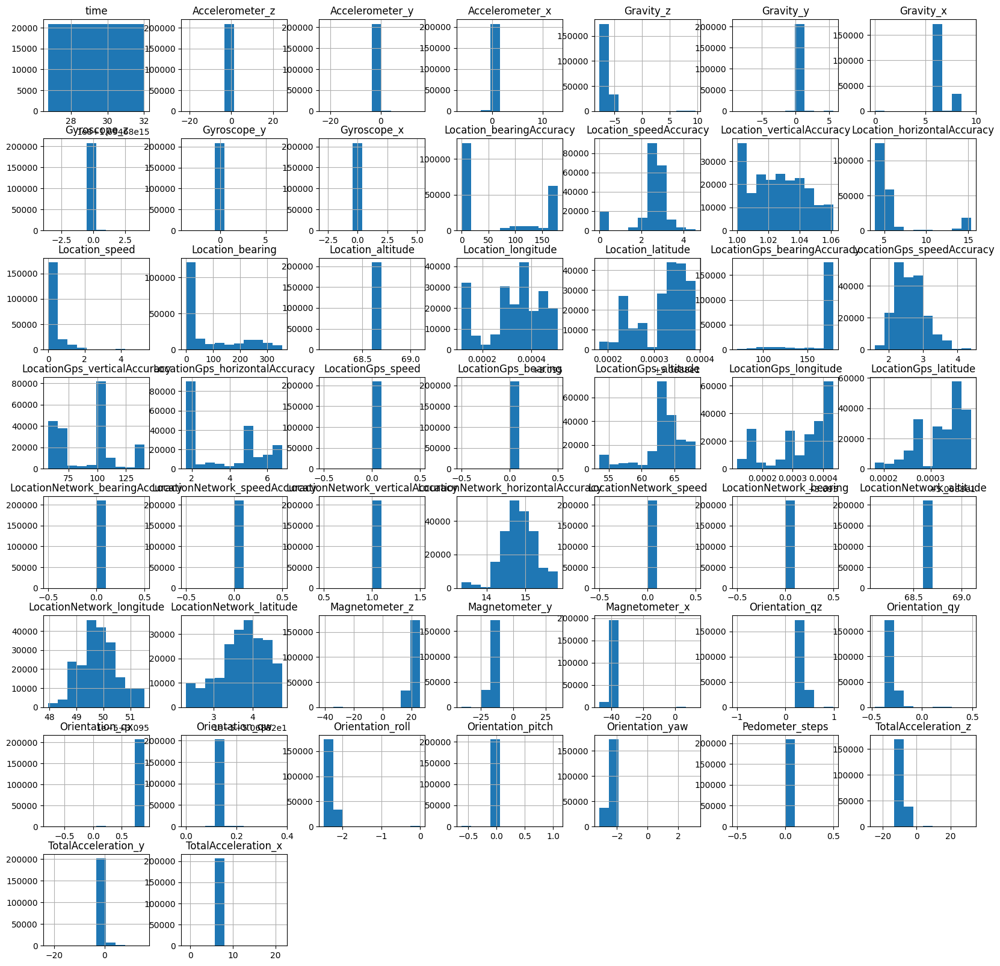

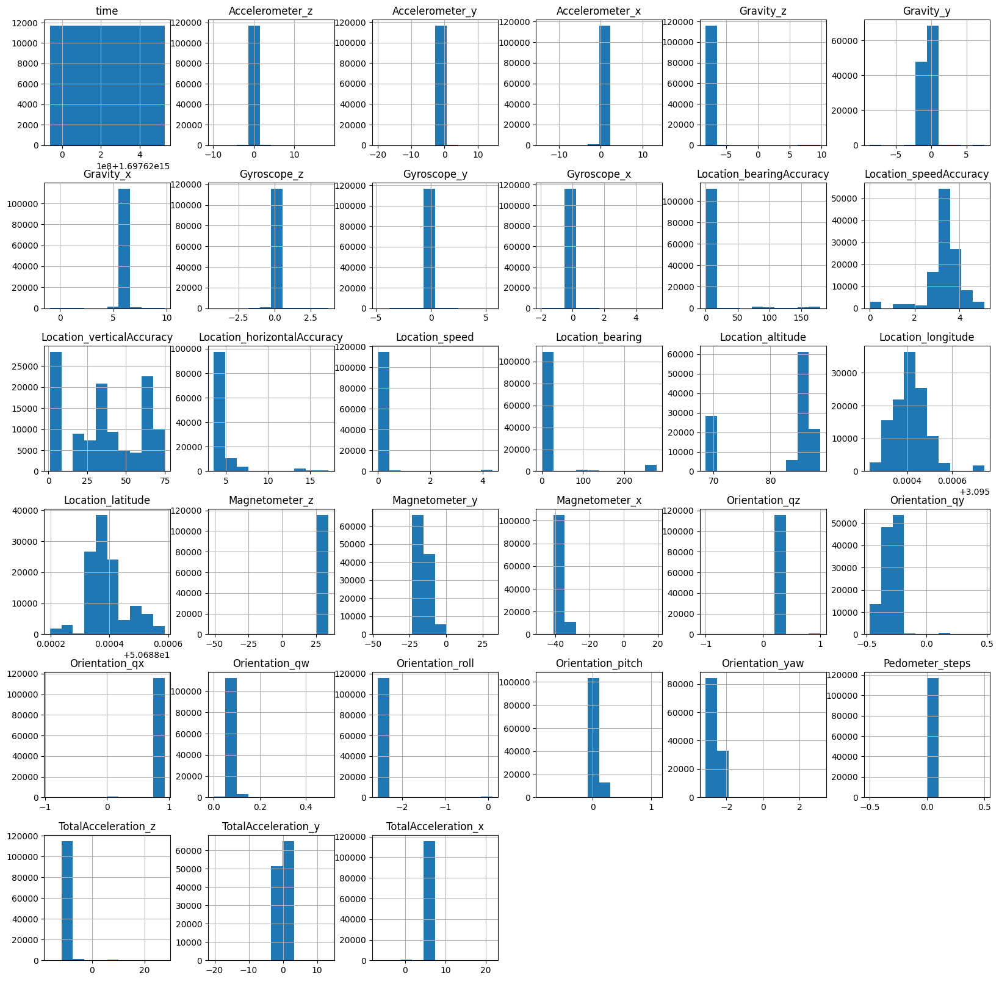

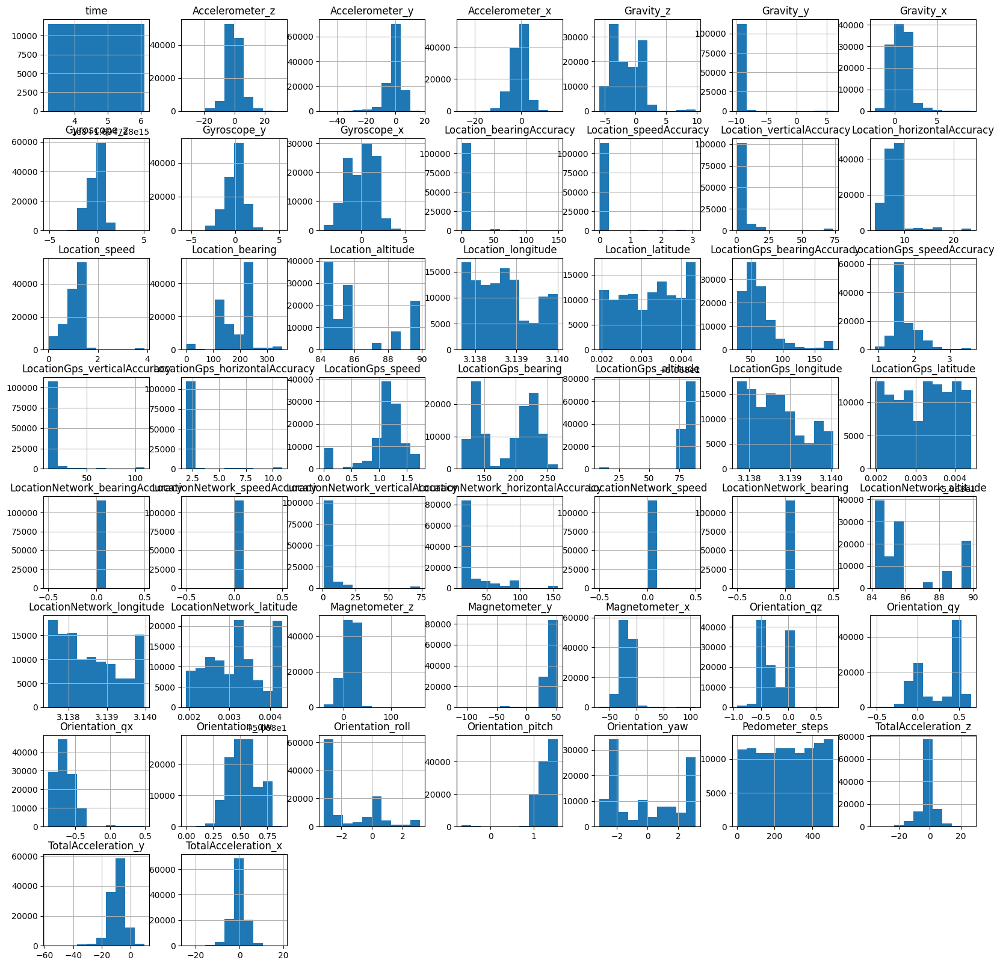

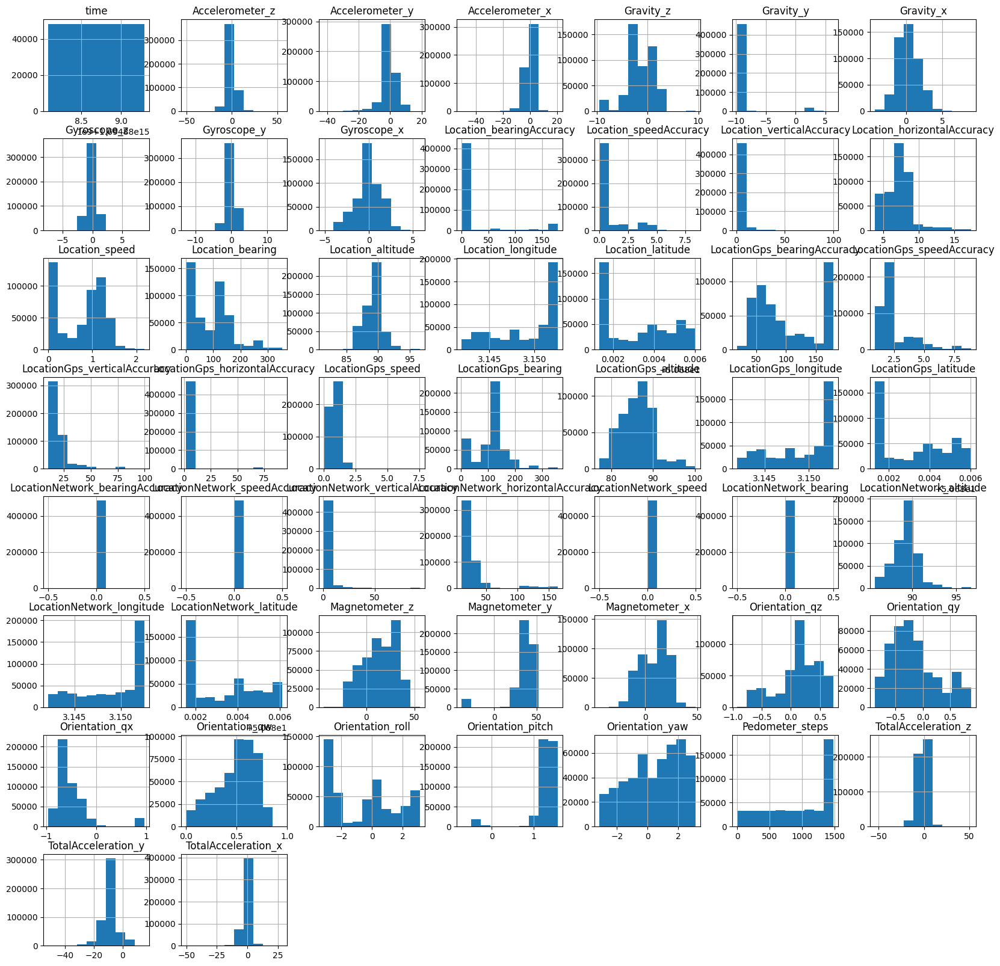

In [45]:
for df in dataframes:
    df.hist(figsize = (20, 20))

Columns LocationNetwork_bearingAccuracy, LocationNetwork_speedAccuracy, LocationNetwork_horizontalAccuracy, LocationNetwork_speed, LocationNetwork_bearing, Location_horizontalAccuracy, LocationGps_horizontalAccuracy to check.

In [46]:
for df in dataframes:
    if 'LocationNetwork_bearingAccuracy' in df.columns:
        print(df['LocationNetwork_bearingAccuracy'].describe())
        print()
    if 'LocationNetwork_speedAccuracy' in df.columns:
        print(df['LocationNetwork_speedAccuracy'].describe())
        print()
    if 'LocationNetwork_horizontalAccuracy' in df.columns:
        print(df['LocationNetwork_horizontalAccuracy'].describe())
        print()
    if 'LocationNetwork_speed' in df.columns:
        print(df['LocationNetwork_speed'].describe())
        print()
    if 'LocationNetwork_bearing' in df.columns:
        print(df['LocationNetwork_bearing'].describe())
        print()
    if 'Location_horizontalAccuracy' in df.columns:
        print(df['Location_horizontalAccuracy'].describe())
        print()
    if 'LocationGPS_horizontalAccuracy' in df.columns:
        print(df['LocationGPS_horizontalAccuracy'].describe())
        print()

count    71461.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: LocationNetwork_bearingAccuracy, dtype: float64

count    71461.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: LocationNetwork_speedAccuracy, dtype: float64

count    71461.000000
mean        42.046940
std         43.059080
min         12.088000
25%         18.891001
50%         23.565001
75%         34.575001
max        156.899994
Name: LocationNetwork_horizontalAccuracy, dtype: float64

count    71461.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: LocationNetwork_speed, dtype: float64

count    71461.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: LocationNetwork_bearing, dtype: float64

count    71461.000000


Almost all columns from above are 0 - delete them.

### Reduction of unnecessary features

In [47]:
def modify_data(df):
    # Calculate the magnitude of Gyroscope
    df['Gyroscope'] = np.sqrt(df['Gyroscope_x']**2 + df['Gyroscope_y']**2 + df['Gyroscope_z']**2)
    
    # Calculate the magnitude of Magnetometer
    df['Magnetometer'] = np.sqrt(df['Magnetometer_x']**2 + df['Magnetometer_y']**2 + df['Magnetometer_z']**2)
    
    # Calculate the magnitude of Total Acceleration
    df['TotalAcceleration'] = np.sqrt(df['TotalAcceleration_x']**2 + df['TotalAcceleration_y']**2 + df['TotalAcceleration_z']**2)
    
    # Select the required columns
    df = df[['id', 'time', 'Gyroscope', 'Location_speed', 'Orientation_roll', 'Orientation_pitch', 
             'Orientation_yaw', 'Pedometer_steps', 'Magnetometer', 'TotalAcceleration', 
             'Location_longitude', 'Location_latitude', 'Location_altitude', 'Location_bearing']]
    
    return df

In [48]:
cycling_1 = modify_data(cycling_1)
cycling_2 = modify_data(cycling_2)
cycling_3 = modify_data(cycling_3)
cycling_4 = modify_data(cycling_4)
cycling_5 = modify_data(cycling_5)
cycling_6 = modify_data(cycling_6)
cycling_7 = modify_data(cycling_7)
sitting_8 = modify_data(sitting_8)
sitting_9 = modify_data(sitting_9)
sitting_10 = modify_data(sitting_10)
walking_11 = modify_data(walking_11)
walking_12 = modify_data(walking_12)

In [49]:
dataframes = [cycling_1, cycling_2, cycling_3, cycling_4, cycling_5, cycling_6, cycling_7, sitting_8, sitting_9, sitting_10, walking_11, walking_12]

### Checking for null values

In [50]:
def check_null_values(df):
    print("Checking for null values in the dataset: " + df['id'][0])
    for column in df.columns:
        print(column)
        print(df[column].isnull().sum())
    print()
    print()

In [51]:
for df in dataframes:
    check_null_values(df)

Checking for null values in the dataset: cycling_1
id
0
time
0
Gyroscope
0
Location_speed
0
Orientation_roll
0
Orientation_pitch
0
Orientation_yaw
0
Pedometer_steps
0
Magnetometer
0
TotalAcceleration
0
Location_longitude
0
Location_latitude
0
Location_altitude
0
Location_bearing
0


Checking for null values in the dataset: cycling_2
id
0
time
0
Gyroscope
0
Location_speed
0
Orientation_roll
0
Orientation_pitch
0
Orientation_yaw
0
Pedometer_steps
0
Magnetometer
0
TotalAcceleration
0
Location_longitude
0
Location_latitude
0
Location_altitude
0
Location_bearing
0


Checking for null values in the dataset: cycling_3
id
0
time
0
Gyroscope
0
Location_speed
0
Orientation_roll
0
Orientation_pitch
0
Orientation_yaw
0
Pedometer_steps
0
Magnetometer
0
TotalAcceleration
0
Location_longitude
0
Location_latitude
0
Location_altitude
0
Location_bearing
0


Checking for null values in the dataset: cycling_4
id
0
time
0
Gyroscope
0
Location_speed
0
Orientation_roll
0
Orientation_pitch
0
Orientation_yaw
0

In [52]:
for i in range(len(dataframes)):
    dataframes[i] = dataframes[i].dropna(subset=['Orientation_pitch'])

In [53]:
for df in dataframes:
    check_null_values(df)

Checking for null values in the dataset: cycling_1
id
0
time
0
Gyroscope
0
Location_speed
0
Orientation_roll
0
Orientation_pitch
0
Orientation_yaw
0
Pedometer_steps
0
Magnetometer
0
TotalAcceleration
0
Location_longitude
0
Location_latitude
0
Location_altitude
0
Location_bearing
0


Checking for null values in the dataset: cycling_2
id
0
time
0
Gyroscope
0
Location_speed
0
Orientation_roll
0
Orientation_pitch
0
Orientation_yaw
0
Pedometer_steps
0
Magnetometer
0
TotalAcceleration
0
Location_longitude
0
Location_latitude
0
Location_altitude
0
Location_bearing
0


Checking for null values in the dataset: cycling_3
id
0
time
0
Gyroscope
0
Location_speed
0
Orientation_roll
0
Orientation_pitch
0
Orientation_yaw
0
Pedometer_steps
0
Magnetometer
0
TotalAcceleration
0
Location_longitude
0
Location_latitude
0
Location_altitude
0
Location_bearing
0


Checking for null values in the dataset: cycling_4
id
0
time
0
Gyroscope
0
Location_speed
0
Orientation_roll
0
Orientation_pitch
0
Orientation_yaw
0

There are no missing values now.

### Histograms for every column in every csv

In [54]:
import matplotlib.pyplot as plt

def plot_histograms(df):
    print("Histograms for: " + df['id'][0])

    num_columns = len(df.columns)
    num_rows = (num_columns + 2) // 3  

    fig, axes = plt.subplots(num_rows, 3, figsize=(20, 5 * num_rows))
    axes = axes.flatten()  

    for i, column in enumerate(df.columns):
        axes[i].hist(df[column], bins=20, color='skyblue', edgecolor='black')
        axes[i].set_title(f'Histogram of {column}')
        axes[i].set_xlabel(column)
        axes[i].set_ylabel('Frequency')
        axes[i].grid(True)
    
    # Ukrywanie pustych subplotów, jeśli istnieją
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

    print()
    print()

Histograms for: cycling_1


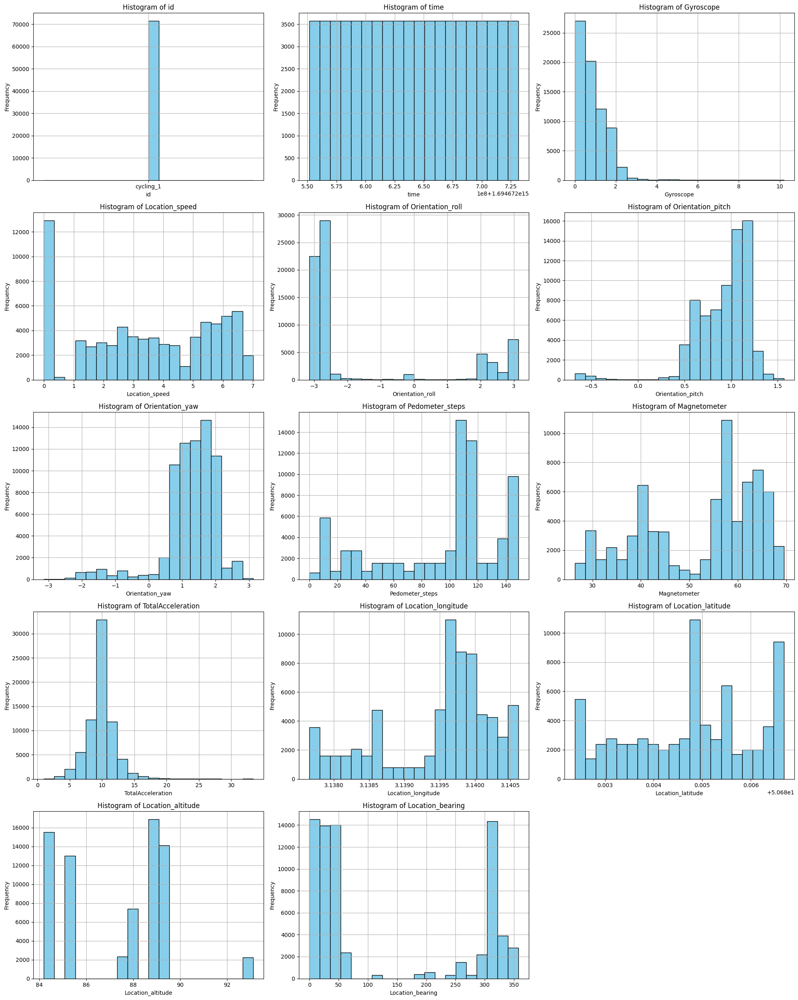



Histograms for: cycling_2


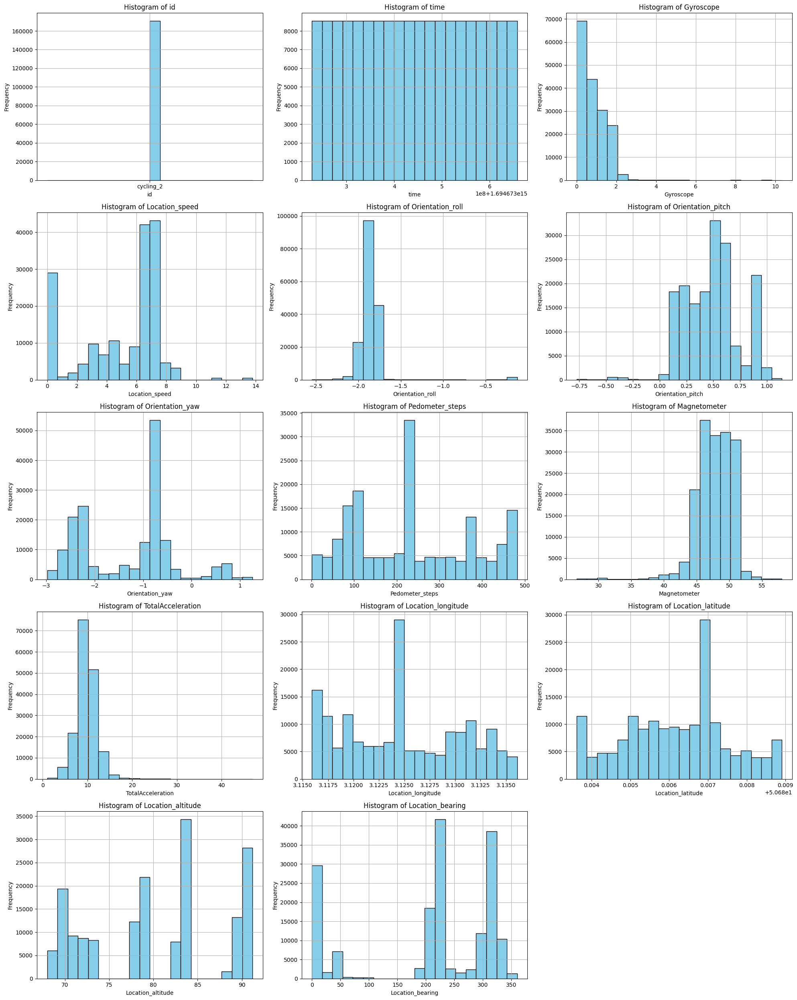



Histograms for: cycling_3


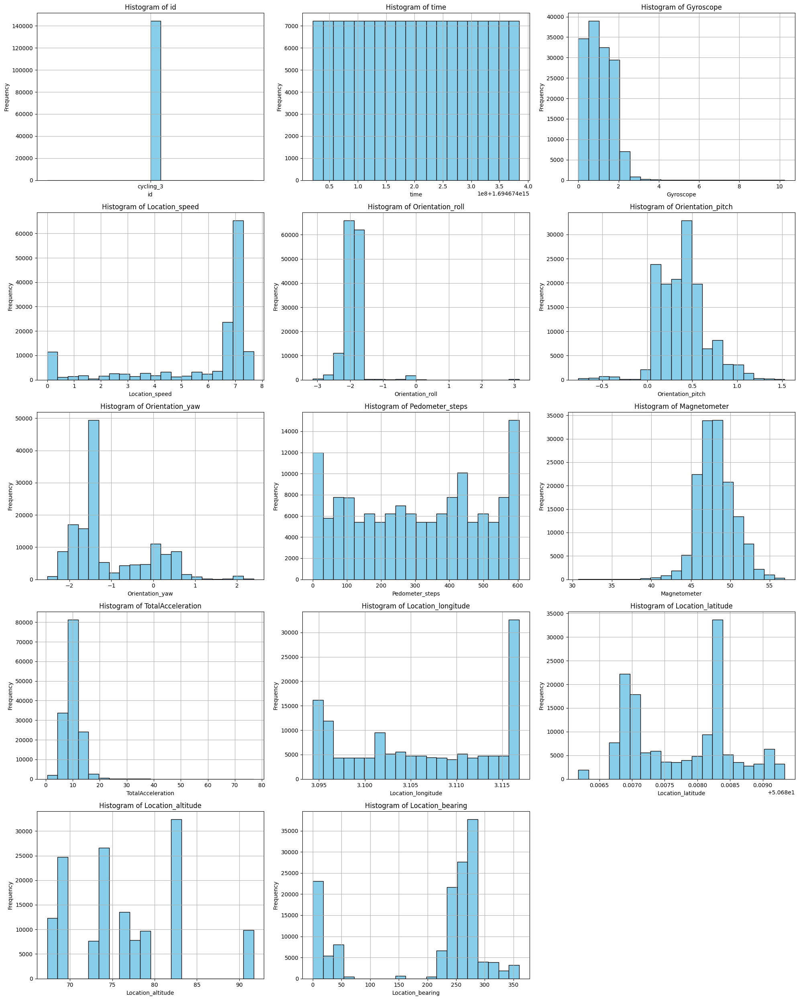



Histograms for: cycling_4


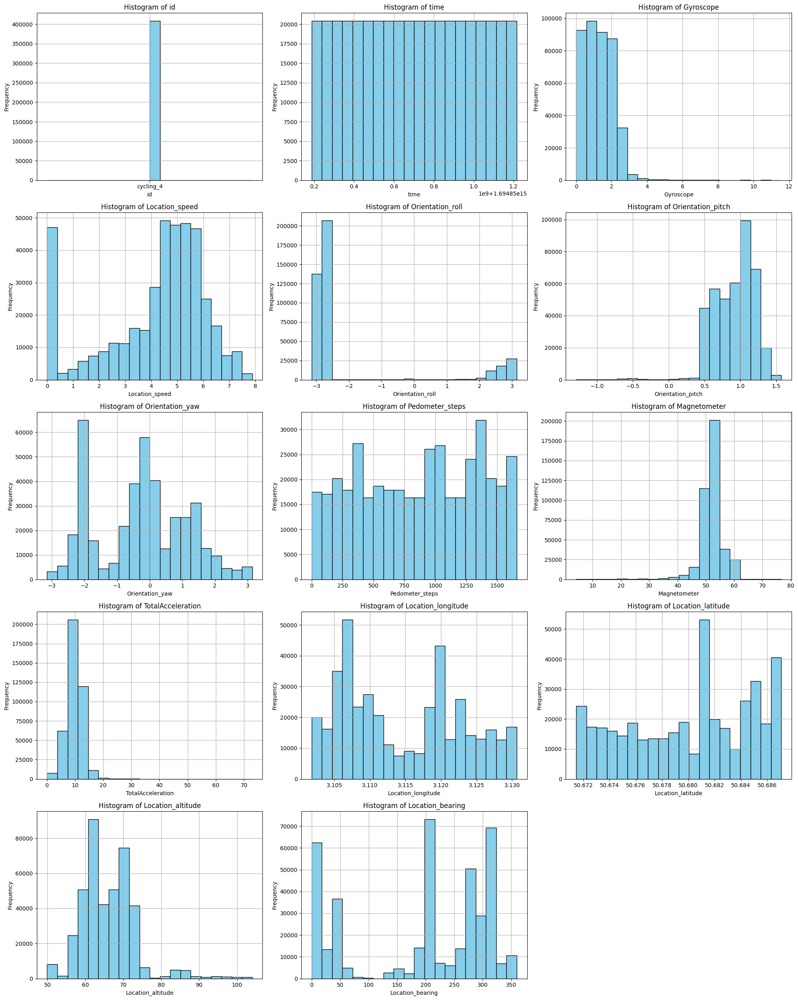



Histograms for: cycling_5


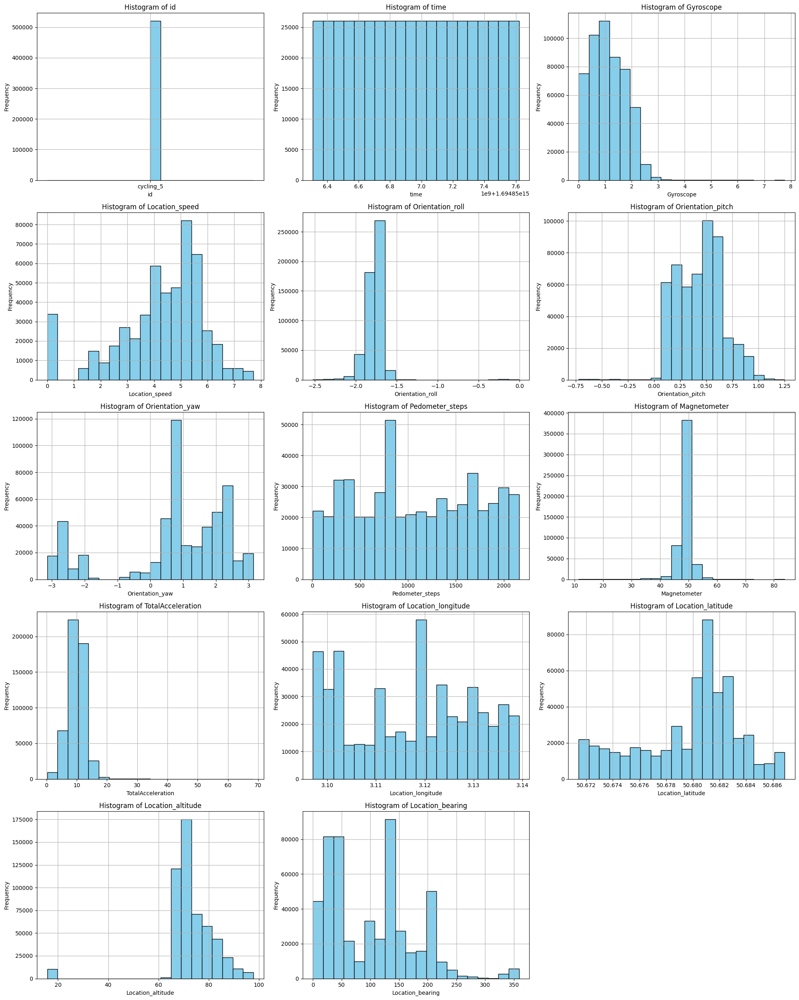



Histograms for: cycling_6


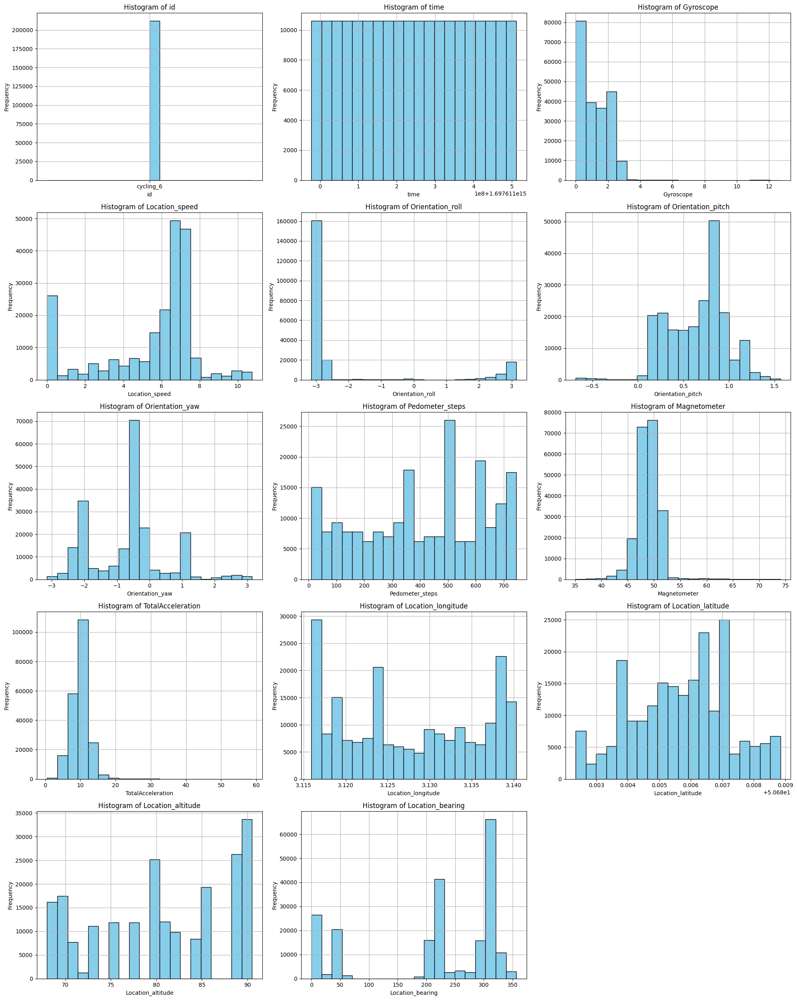



Histograms for: cycling_7


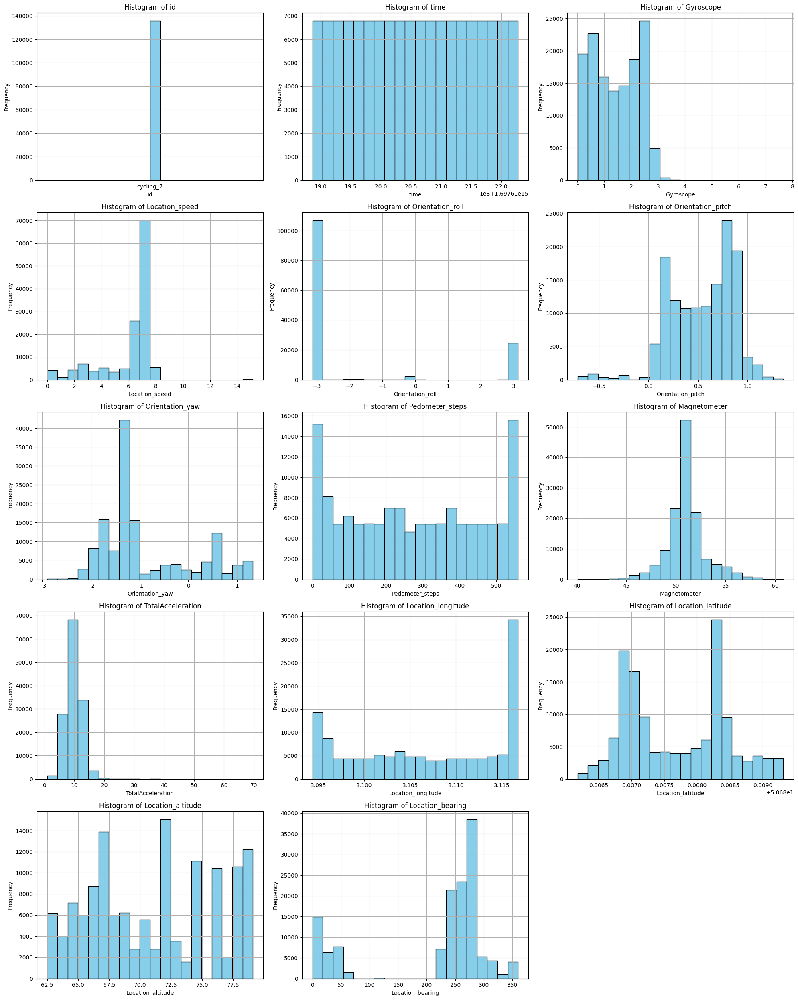



Histograms for: sitting_8


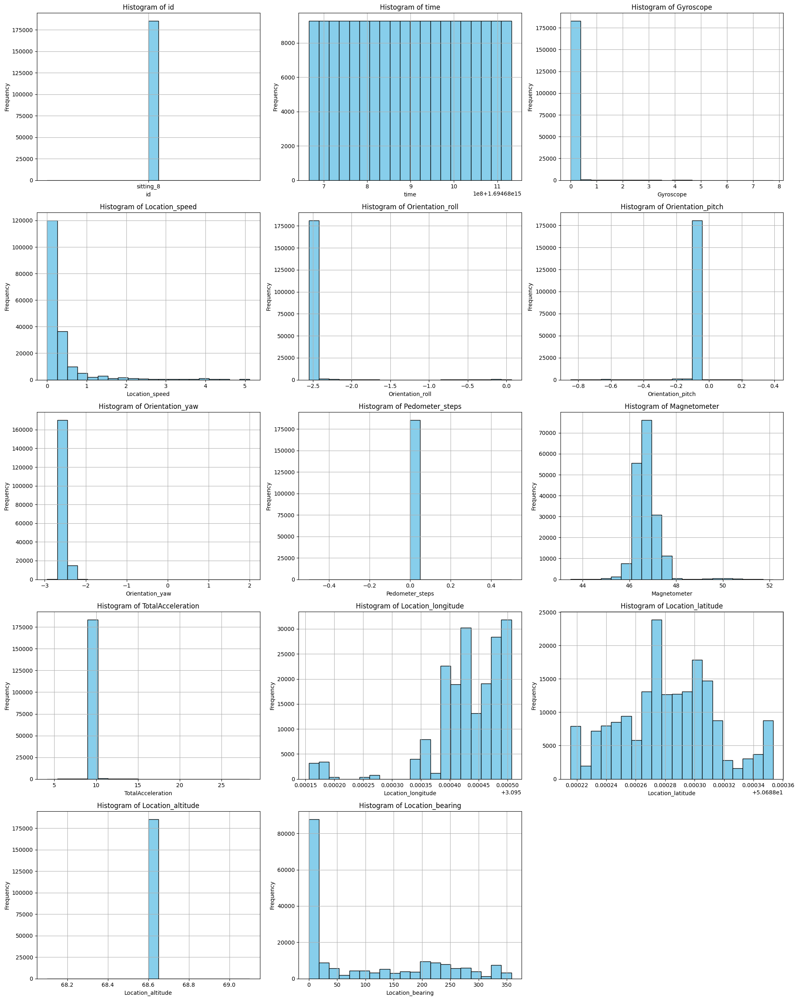



Histograms for: sitting_9


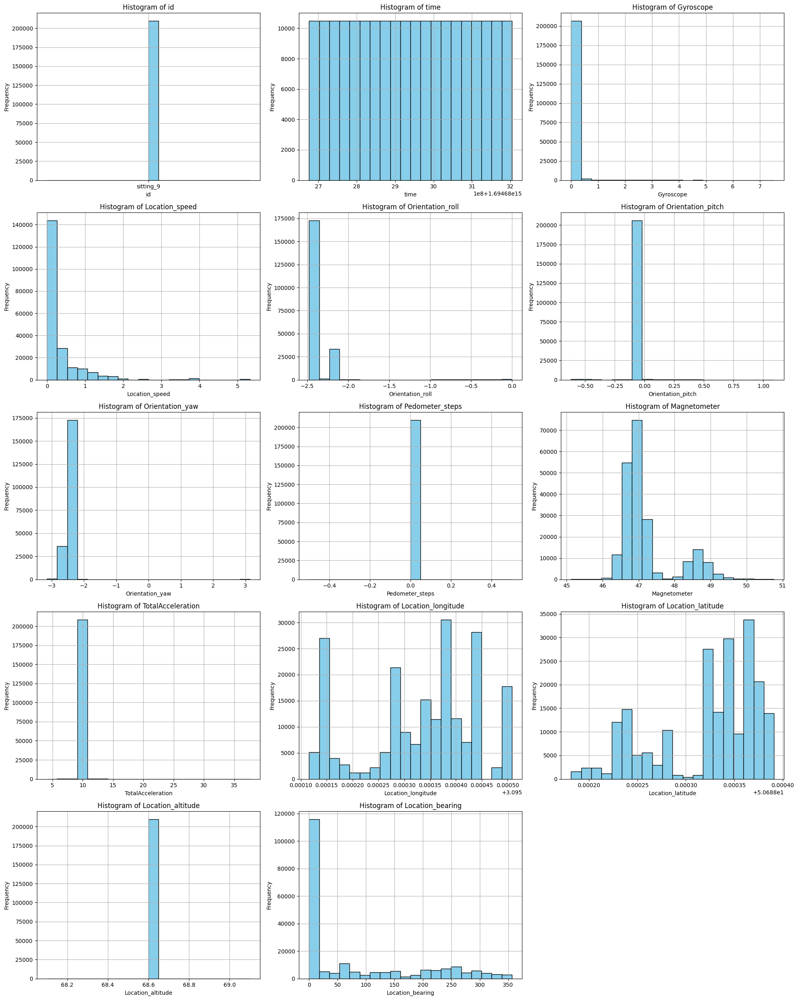



Histograms for: sitting_10


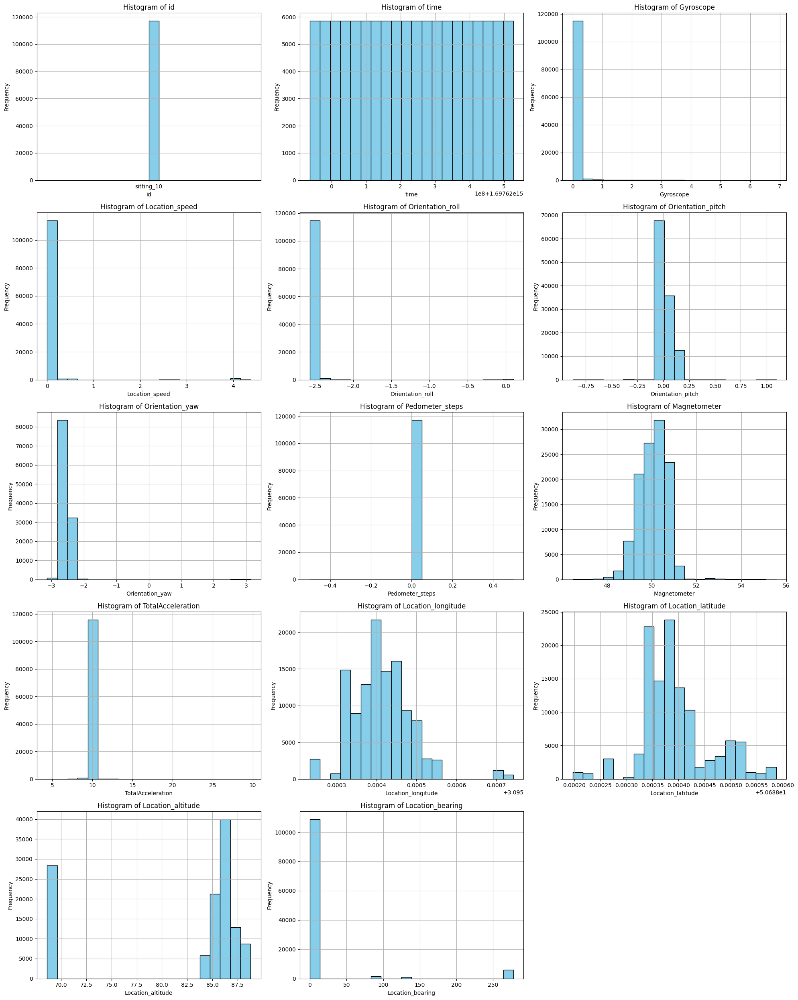



Histograms for: walking_11


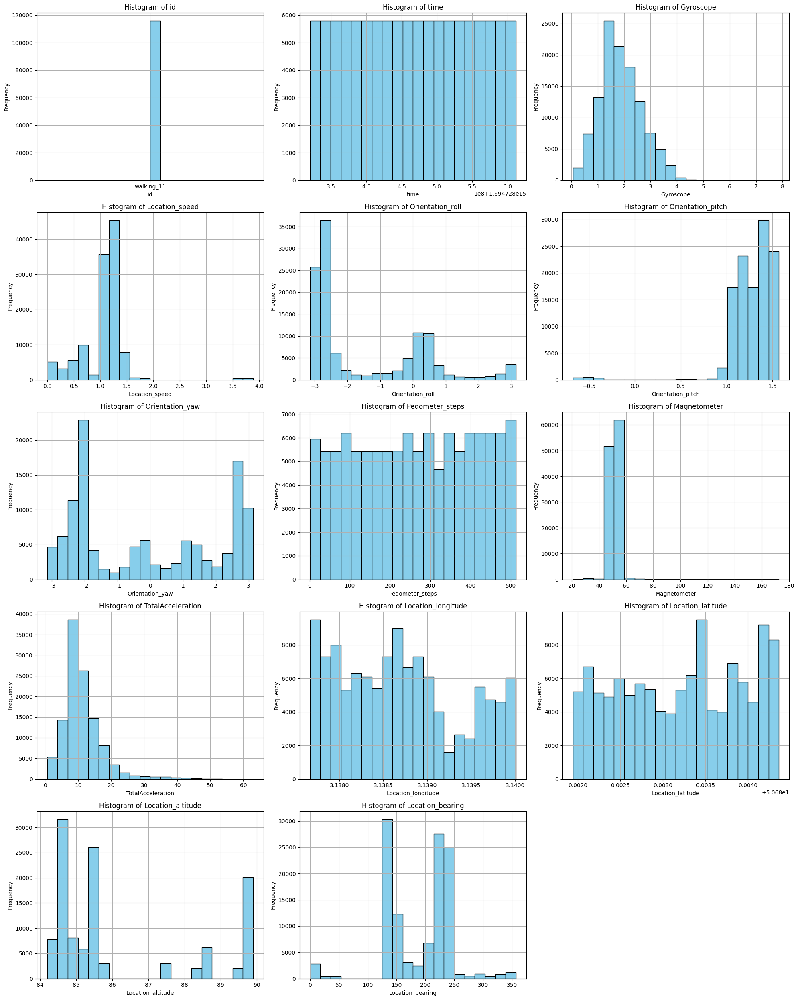



Histograms for: walking_12


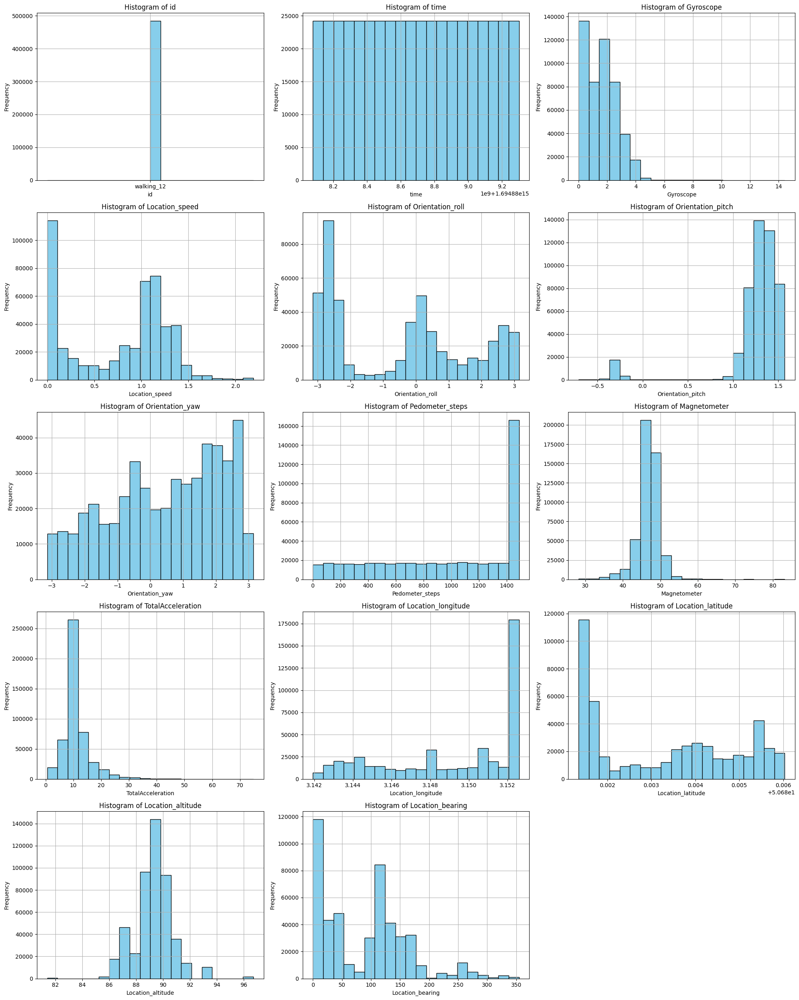

In [55]:
for df in dataframes:
    plot_histograms(df)

### Boxplots for every column in every csv

In [56]:
def plot_boxplots(df):
    num_columns = len(df.columns) - 1  
    num_rows = (num_columns + 2) // 3 
    fig, axes = plt.subplots(num_rows, 3, figsize=(20, 5 * num_rows))
    axes = axes.flatten() 

    for i, column in enumerate(df.columns):
        if column == 'id':
            continue
        axes[i].boxplot(df[column]) 
        axes[i].set_title(f'Boxplot of {column}')  
        axes[i].set_xlabel(column)  
        axes[i].set_ylabel('Values')  
        axes[i].grid(True)  
    
    # Ukrywanie pustych subplotów, jeśli istnieją
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

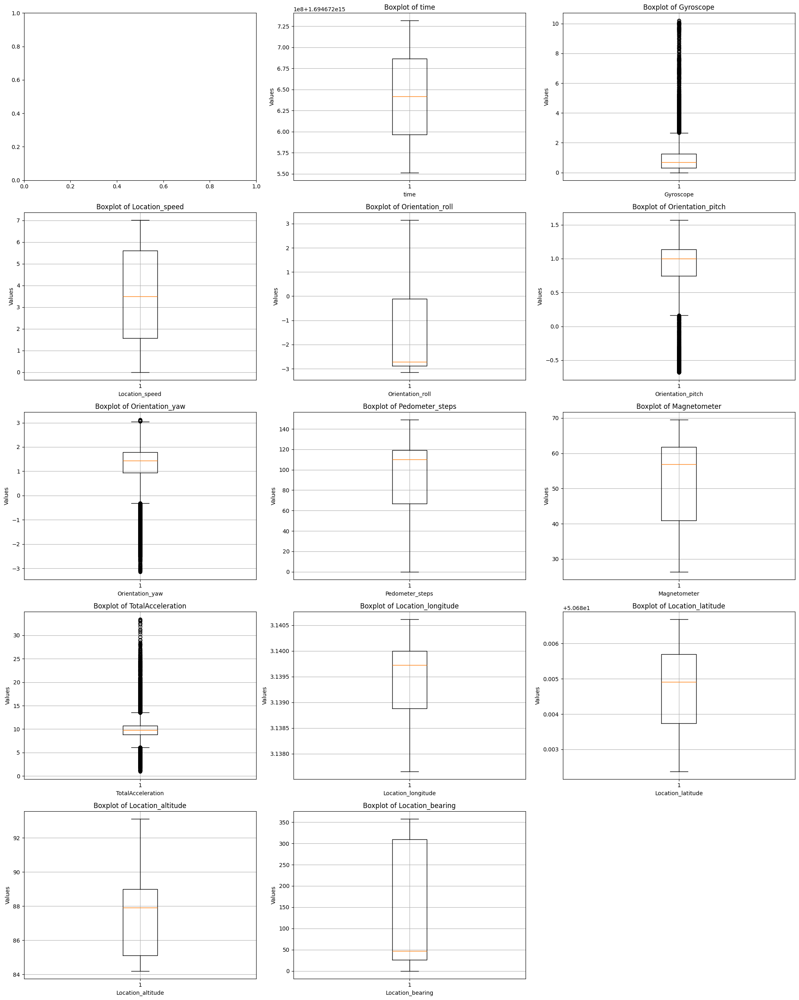

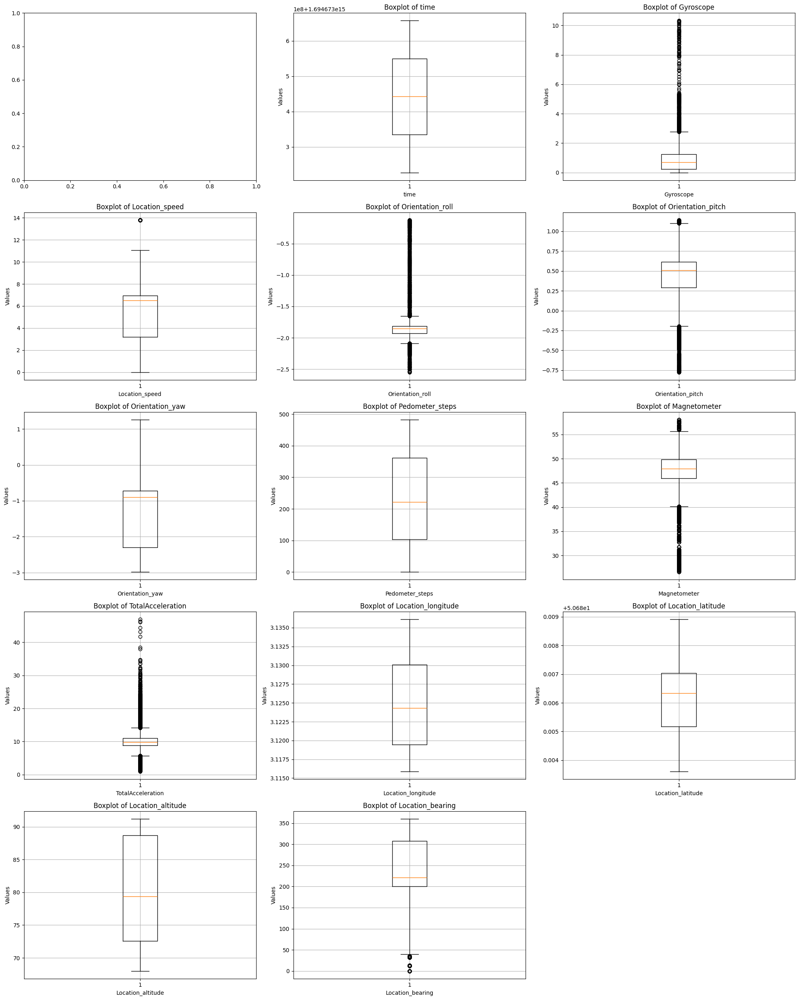

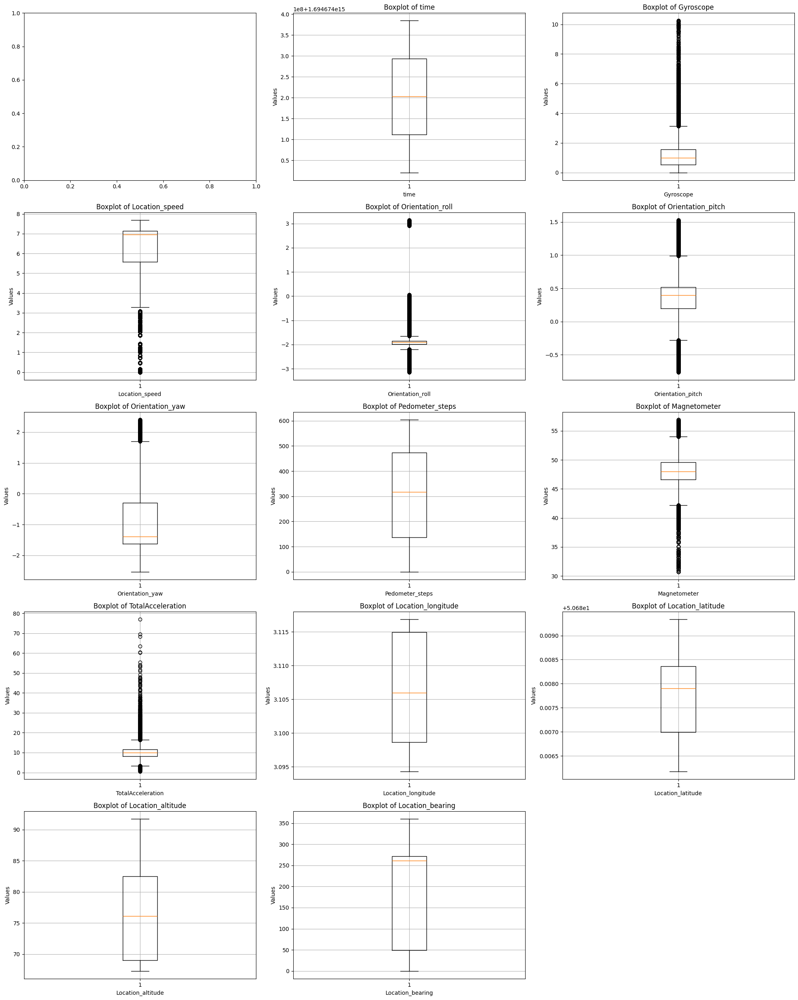

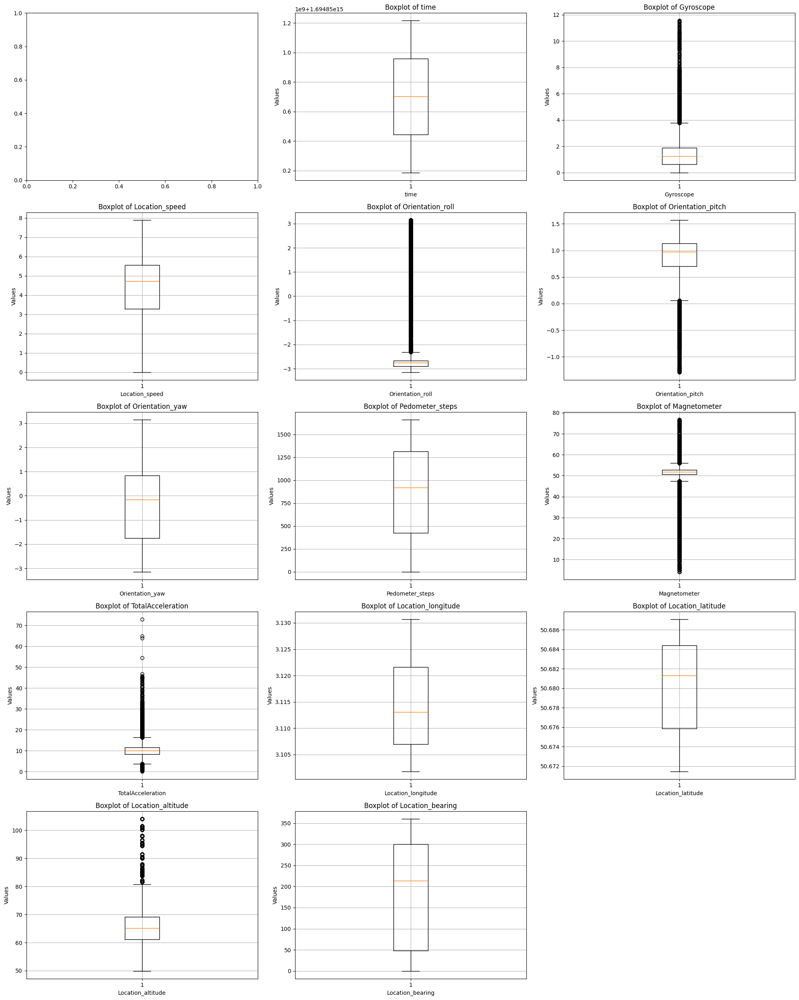

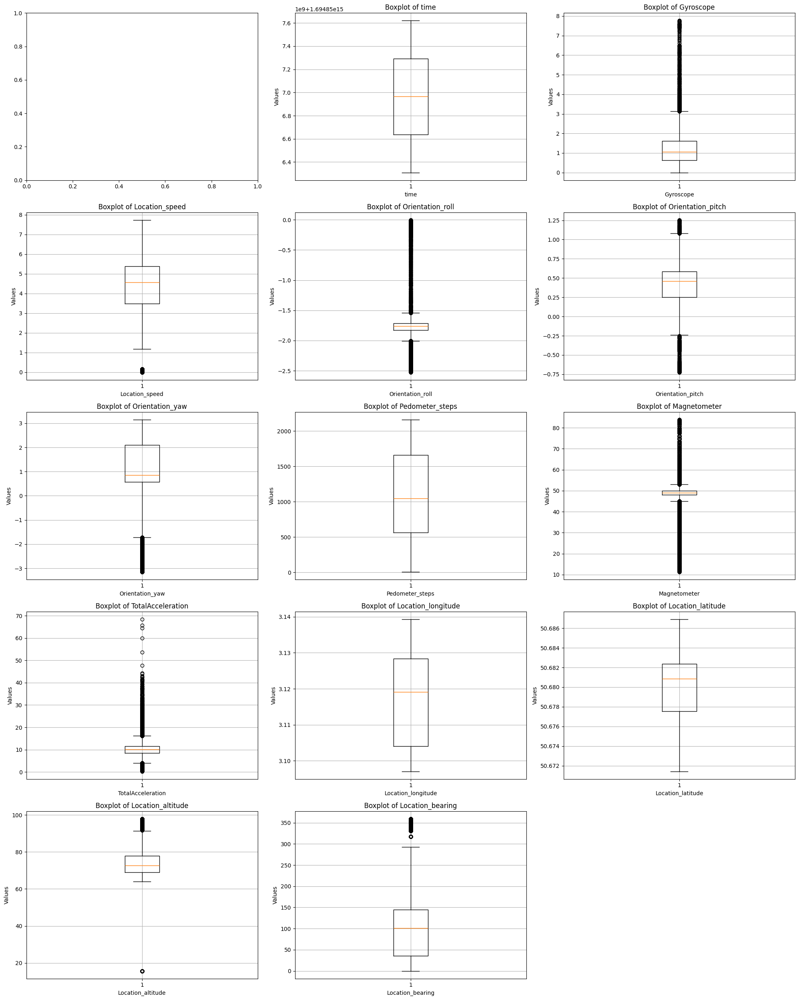

...

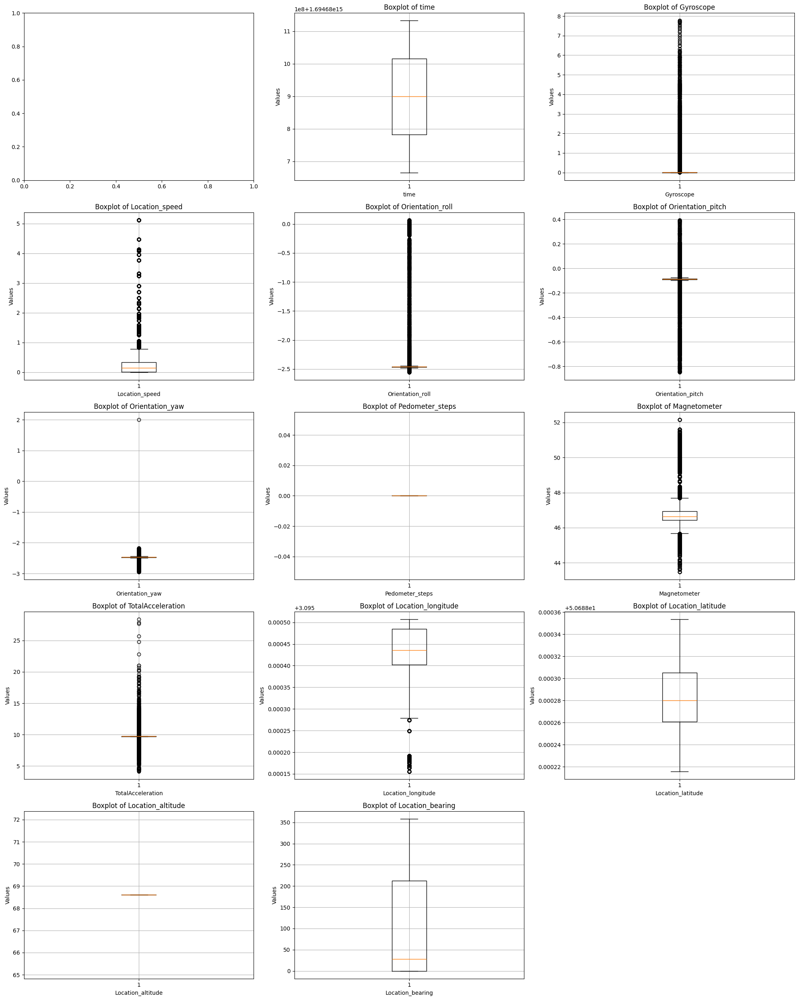

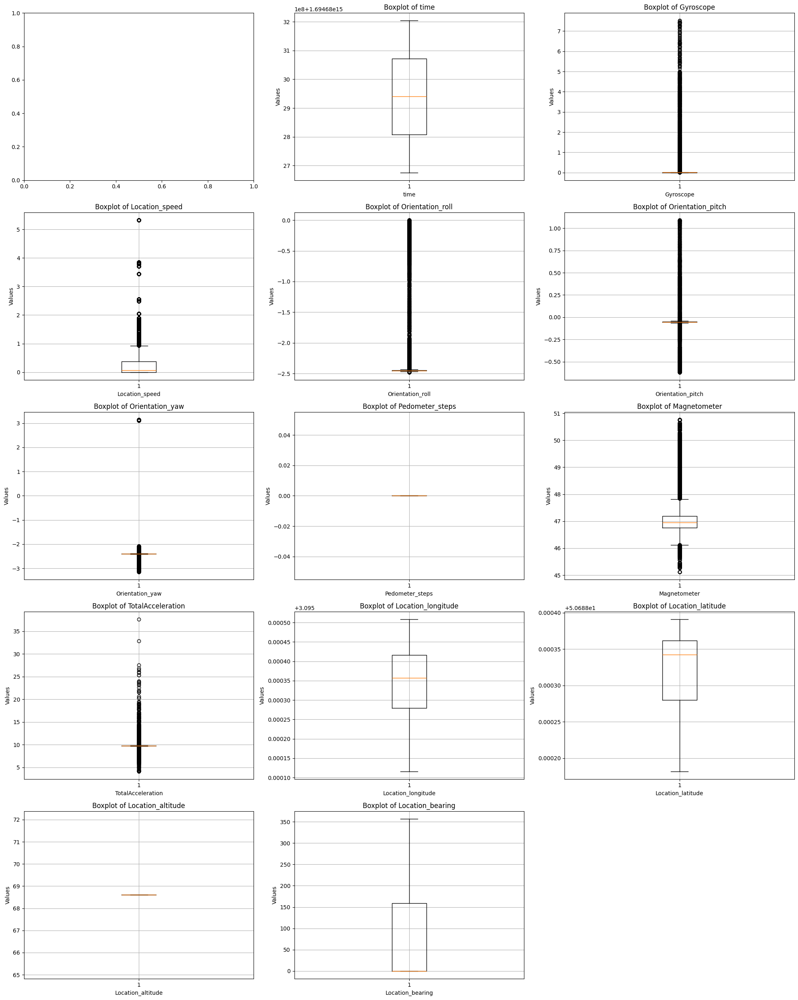

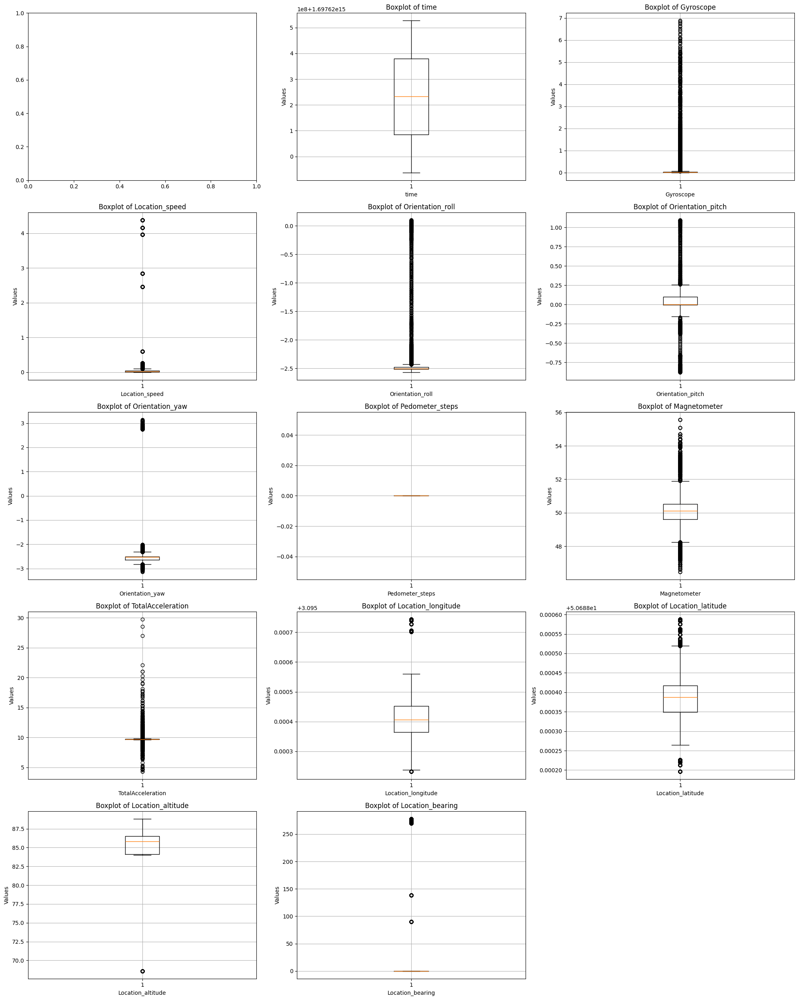

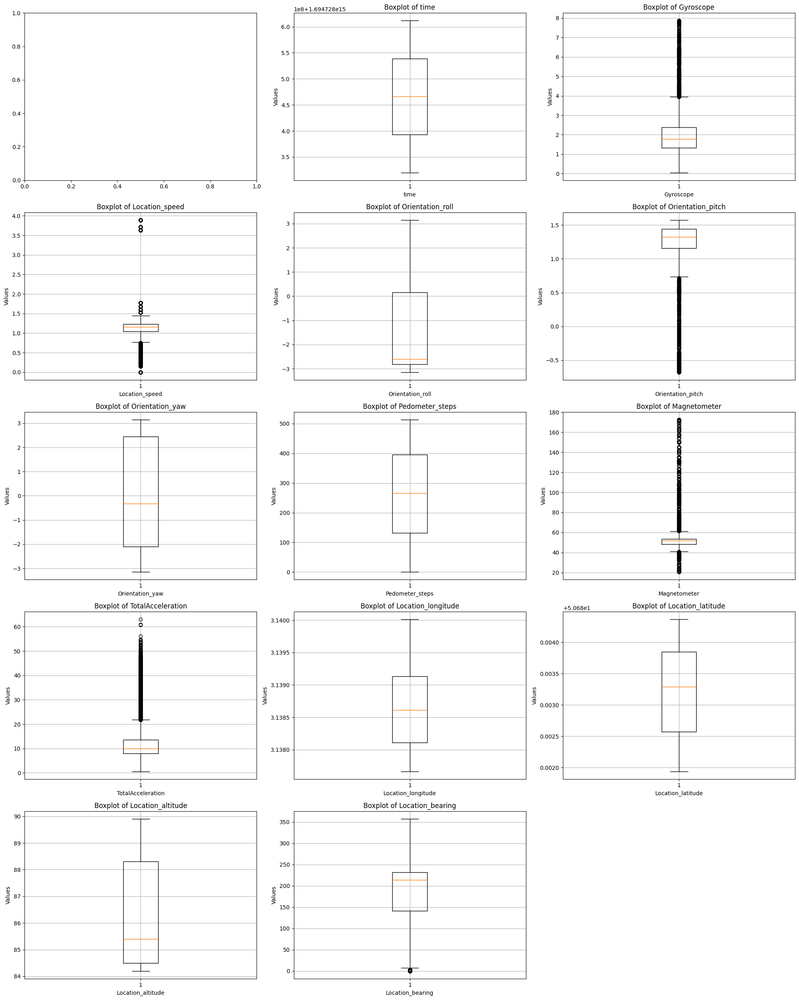

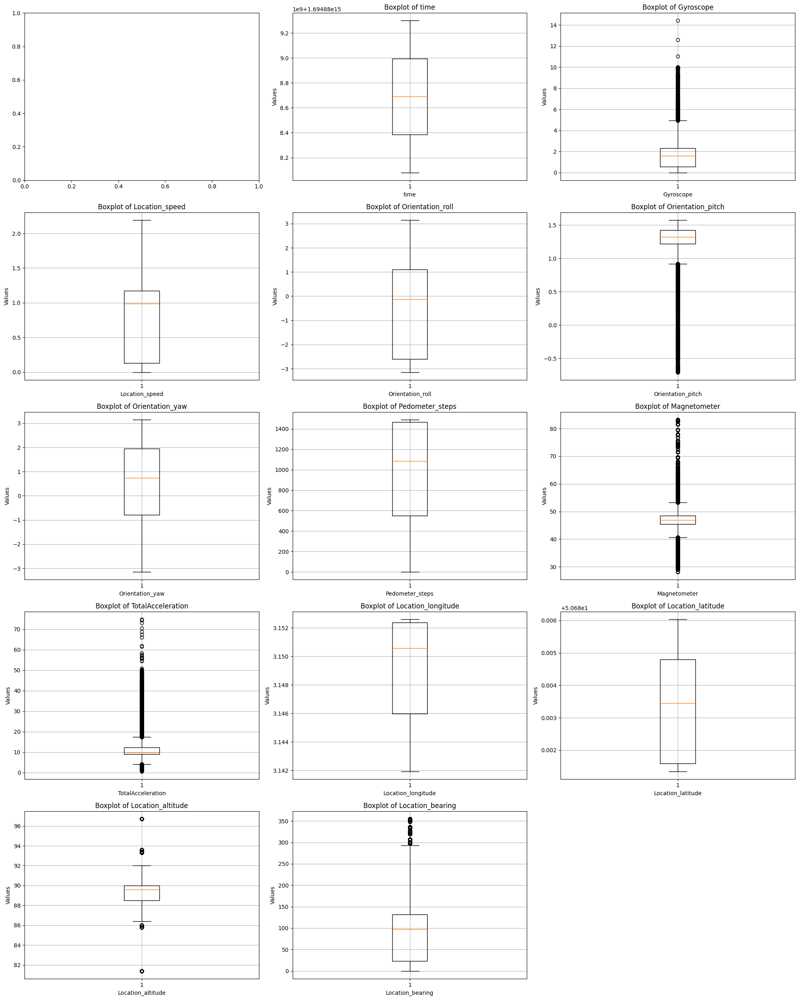

In [57]:
for df in dataframes:
    plot_boxplots(df)

### Replacing outliers in Location_speed

We think that we should replace outliers in Location_speed column.

In [58]:
def replace_outliers_with_quantile(df):
    speed_quantile = df['Location_speed'].quantile(0.8)
    
    df.loc[df['Location_speed'] > speed_quantile, 'Location_speed'] = speed_quantile
    
    return df

In [65]:
for df in dataframes:
    replace_outliers_with_quantile(df)

## **Feature engineering**

We will stary by defining function to calculate total distance.

In [60]:
def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Calculate the great-circle distance between two points
    on the Earth's surface specified in decimal degrees using the Haversine formula.
    """
    # Przeliczanie na radiany
    lat1 = math.radians(lat1)
    lon1 = math.radians(lon1)
    lat2 = math.radians(lat2)
    lon2 = math.radians(lon2)
    
    # Różnica między szerokościami i długościami geograficznymi
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    
    # Obliczanie odległości za pomocą formuły haversine
    a = math.sin(dlat / 2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon / 2)**2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    R = 6371 # Średnica Ziemi w kilometrach
    distance = R * c
    
    return distance # Odległość w kilometrach

### Function to summarise activity

A function that aggregates available data about one activity.

In [61]:
def summarise_activity(df):
    # Obliczenie statystyk podsumowujących
    df_tmp = pd.DataFrame({
        'id': [df['id'].iloc[0]],  # Unikalne id
        'total_time': (df['time'].max() - df['time'].min()) / 10 ** 6,  # Czas trwania w sekundach
        
        'mean_speed': df['Location_speed'].mean() * 3.6,  # Średnia prędkość w km/h
        'max_speed': df['Location_speed'].max() * 3.6,  # Maksymalna prędkość w km/h
        'min_speed': df['Location_speed'].min() * 3.6,  # Minimalna prędkość w km/h
        
        'total_distance': 0,  # Inicjalizacja całkowitej odległości
        
        'mean_acceleration': df['TotalAcceleration'].mean(),  # Średnie przyspieszenie
        'max_acceleration': df['TotalAcceleration'].max(),  # Maksymalne przyspieszenie
        'min_acceleration': df['TotalAcceleration'].min(),  # Minimalne przyspieszenie
        'sd_acceleration': df['TotalAcceleration'].std(),  # Odchylenie standardowe przyspieszenia
        
        'mean_gyroscope': df['Gyroscope'].mean(),  # Średnie gyro
        'mean_magnetometer': df['Magnetometer'].mean(),  # Średni magnetometr
        
        'steps_per_minute': (df['Pedometer_steps'].max() / ((df['time'].max() - df['time'].min()) / (60 * (10 ** 6)))),  # Kroki na minutę
        'total_steps': df['Pedometer_steps'].max(),  # Całkowita liczba kroków
        
        'average_roll': df['Orientation_roll'].mean(),  # Średni roll
        'median_roll': df['Orientation_roll'].median(),  # Mediana roll
        'min_roll': df['Orientation_roll'].min(),  # Minimalny roll
        'max_roll': df['Orientation_roll'].max(),  # Maksymalny roll
        'sd_roll': df['Orientation_roll'].std(),  # Odchylenie standardowe roll
        
        'average_pitch': df['Orientation_pitch'].mean(),  # Średni pitch
        'median_pitch': df['Orientation_pitch'].median(),  # Mediana pitch
        'min_pitch': df['Orientation_pitch'].min(),  # Minimalny pitch
        'max_pitch': df['Orientation_pitch'].max(),  # Maksymalny pitch
        'sd_pitch': df['Orientation_pitch'].std(),  # Odchylenie standardowe pitch
        
        'average_yaw': df['Orientation_yaw'].mean(),  # Średni yaw
        'median_yaw': df['Orientation_yaw'].median(),  # Mediana yaw
        'min_yaw': df['Orientation_yaw'].min(),  # Minimalny yaw
        'max_yaw': df['Orientation_yaw'].max(),  # Maksymalny yaw
        'sd_yaw': df['Orientation_yaw'].std()  # Odchylenie standardowe yaw
    })
    
    total_distance = 0
    for i in range(len(df) - 1):
        distance = haversine_distance(
            df['Location_latitude'].iloc[i], df['Location_longitude'].iloc[i],
            df['Location_latitude'].iloc[i + 1], df['Location_longitude'].iloc[i + 1]
        )
        total_distance += distance
    
    df_tmp['total_distance'] = total_distance
    
    return df_tmp

In [68]:
result = pd.concat([
    summarise_activity(dataframes[0]),
    summarise_activity(dataframes[1]),
    summarise_activity(dataframes[2]),
    summarise_activity(dataframes[3]),
    summarise_activity(dataframes[4]),
    summarise_activity(dataframes[5]),
    summarise_activity(dataframes[6]),
    summarise_activity(dataframes[7]),
    summarise_activity(dataframes[8]),
    summarise_activity(dataframes[9]),
    summarise_activity(dataframes[10]),
    summarise_activity(dataframes[11])
], ignore_index=True)

In [63]:
result

,id,total_time,mean_speed,max_speed,min_speed,total_distance,mean_acceleration,max_acceleration,min_acceleration,sd_acceleration,...,average_pitch,median_pitch,min_pitch,max_pitch,sd_pitch,average_yaw,median_yaw,min_yaw,max_yaw,sd_yaw
0,cycling_1,180.007026,12.390490,25.226319,0.000000,0.691279,9.839644,33.370849,1.000849,2.208068,...,0.920359,0.997693,-0.676056,1.567361,0.305094,1.273406,1.437144,-3.136301,3.120038,0.829768
1,cycling_2,430.007260,18.063342,49.625282,0.000000,2.380647,9.863310,46.913085,1.001542,2.261824,...,0.488994,0.508881,-0.774307,1.139378,0.254460,-1.298452,-0.901927,-2.978770,1.257827,0.946952
2,cycling_3,363.860082,20.854885,27.663918,0.000000,2.275249,9.978553,76.925077,0.575971,2.858391,...,0.390804,0.397393,-0.764246,1.528574,0.269638,-1.042423,-1.396147,-2.532841,2.398587,0.907992
3,cycling_4,1029.075131,15.069146,28.373773,0.000025,4.654398,9.912809,72.929734,0.118906,2.795965,...,0.918021,0.972495,-1.290022,1.569820,0.275410,-0.254119,-0.155153,-3.141519,3.141530,1.391417
4,cycling_5,1311.223425,15.258023,27.796914,0.000000,6.044124,9.939778,68.412531,0.249030,2.771427,...,0.439639,0.458969,-0.722621,1.251450,0.219892,0.714380,0.853866,-3.141581,3.141590,1.678895
5,cycling_6,533.992808,19.686716,38.698239,0.000000,3.113731,9.825505,58.775965,0.548410,2.432842,...,0.657150,0.736892,-0.682453,1.567613,0.318555,-0.666067,-0.500597,-3.141049,3.140813,1.154993
6,cycling_7,341.845532,21.926998,54.531821,0.000000,2.310182,9.883083,69.647042,0.933491,2.665324,...,0.544492,0.601517,-0.715595,1.360833,0.320639,-0.889273,-1.238989,-2.899235,1.325698,0.922948
7,sitting_8,467.038277,1.247948,18.418591,0.000000,0.213102,9.724355,28.370767,4.133900,0.258726,...,-0.091602,-0.086767,-0.847341,0.392890,0.048161,-2.464357,-2.466826,-2.942872,2.001436,0.028381
8,sitting_9,528.028032,1.109249,19.156421,0.000000,0.192527,9.732602,37.601506,4.111583,0.263815,...,-0.055674,-0.054342,-0.617031,1.090328,0.050653,-2.427302,-2.395759,-3.140784,3.137584,0.132505
9,sitting_10,589.504701,0.304995,15.750578,0.000000,0.420802,9.720443,29.723517,4.337553,0.216443,...,0.039484,0.000749,-0.876949,1.092849,0.071849,-2.533285,-2.528267,-3.132059,3.137194,0.181175


## **Saving to csv file**

In [64]:
result.to_csv("..//final_data//result_data.csv", index=False)

We have almost ready DataFrame for clustering. It still needs one EDA and one feature engineering, but we'll do that in the next file.